In [1]:
import sys
sys.path.append('../')

import matplotlib.pyplot as plt
import numpy as np
import xarray as xr

from helpers.cm26 import DatasetCM26
from helpers.selectors import select_NA, select_Pacific, select_Cem, select_globe, compare, plot
from helpers.operators import Coarsen, Filtering, Subsampling, CoarsenKochkov, CoarsenWeighted, CoarsenKochkovMinMax
from helpers.ann_tools import import_ANN

import hvplot.xarray
import hvplot
import cmocean

%load_ext autoreload
%autoreload 3

In [22]:
%time ds = DatasetCM26()

CPU times: user 2.88 s, sys: 561 ms, total: 3.44 s
Wall time: 17.9 s


In [23]:
%time SGS = ds.compute_subgrid_forcing(factor=4, FGR_multiplier=None, coarsening=CoarsenWeighted())

CPU times: user 13.7 s, sys: 136 ms, total: 13.8 s
Wall time: 13.3 s


In [24]:
%time SFS = ds.compute_subfilter_forcing(factor=4, FGR_multiplier=3, coarsening=CoarsenKochkovMinMax(), filtering=Filtering())

CPU times: user 11 s, sys: 708 ms, total: 11.7 s
Wall time: 10.5 s


In [25]:
SGS0 = SGS.select2d(time=0)
%time SGS0.data = SGS0.data.compute()
SFS0 = SFS.select2d(time=0)
%time SFS0.data = SFS0.data.compute()

CPU times: user 4.44 s, sys: 1.71 s, total: 6.16 s
Wall time: 3.17 s
CPU times: user 22.6 s, sys: 12.5 s, total: 35 s
Wall time: 13.3 s


In [26]:
ann_Txy_Nov17 = import_ANN('/home/pp2681/MOM6-examples/src/MOM6/experiments/ANN-Results/trained_models/ANN_CM26_grid_harmonic_ver3/Txy_epoch_1000.nc')
ann_Txx_Tyy_Nov17 = import_ANN('/home/pp2681/MOM6-examples/src/MOM6/experiments/ANN-Results/trained_models/ANN_CM26_grid_harmonic_ver3/Txx_Tyy_epoch_1000.nc')

In [67]:
ann_Txy_Nov15 = import_ANN('/home/pp2681/MOM6-examples/src/MOM6/experiments/ANN-Results/trained_models/ANN_CM26/Txy_epoch_2000.nc')
ann_Txx_Tyy_Nov15 = import_ANN('/home/pp2681/MOM6-examples/src/MOM6/experiments/ANN-Results/trained_models/ANN_CM26/Txx_Tyy_epoch_2000.nc')

In [34]:
ann_Tall_colloc = import_ANN('/scratch/pp2681/mom6/CM26_ML_models/ocean3d/Gauss-FGR3/Collocated-NN-params/hdn-32-32/model/Tall.nc')

In [28]:
ann_Txy_stag = import_ANN('/scratch/pp2681/mom6/CM26_ML_models/ocean3d/Gauss-FGR3/EXP-32-32/staggered/model/Txy.nc')
ann_Txx_Tyy_stag = import_ANN('/scratch/pp2681/mom6/CM26_ML_models/ocean3d/Gauss-FGR3/EXP-32-32/staggered/model/Txx_Tyy.nc')

In [52]:
ann_Txy_short = import_ANN('/scratch/pp2681/mom6/CM26_ML_models/ocean3d/Gauss-FGR3/EXP-32-32/short_waves/model/Txy.nc')
ann_Txx_Tyy_short = import_ANN('/scratch/pp2681/mom6/CM26_ML_models/ocean3d/Gauss-FGR3/EXP-32-32/short_waves/model/Txx_Tyy.nc')

In [53]:
ann_Txy_exp1 = import_ANN('/scratch/pp2681/mom6/CM26_ML_models/ocean3d/Gauss-FGR3/EXP1/model/Txy.nc')
ann_Txx_Tyy_exp1 = import_ANN('/scratch/pp2681/mom6/CM26_ML_models/ocean3d/Gauss-FGR3/EXP1/model/Txx_Tyy.nc')

In [31]:
pred = SGS0.state.ANN(ann_Txy_Nov17, ann_Txx_Tyy_Nov17)

Correlation: 0.47773607492070824
Relative Error: 0.9518696705980392
R2 =  0.19724421812761606
R2 max =  0.22823128732177433
Optinal scaling: 0.7307428540405086
Nans [test/control]: [0, 0]


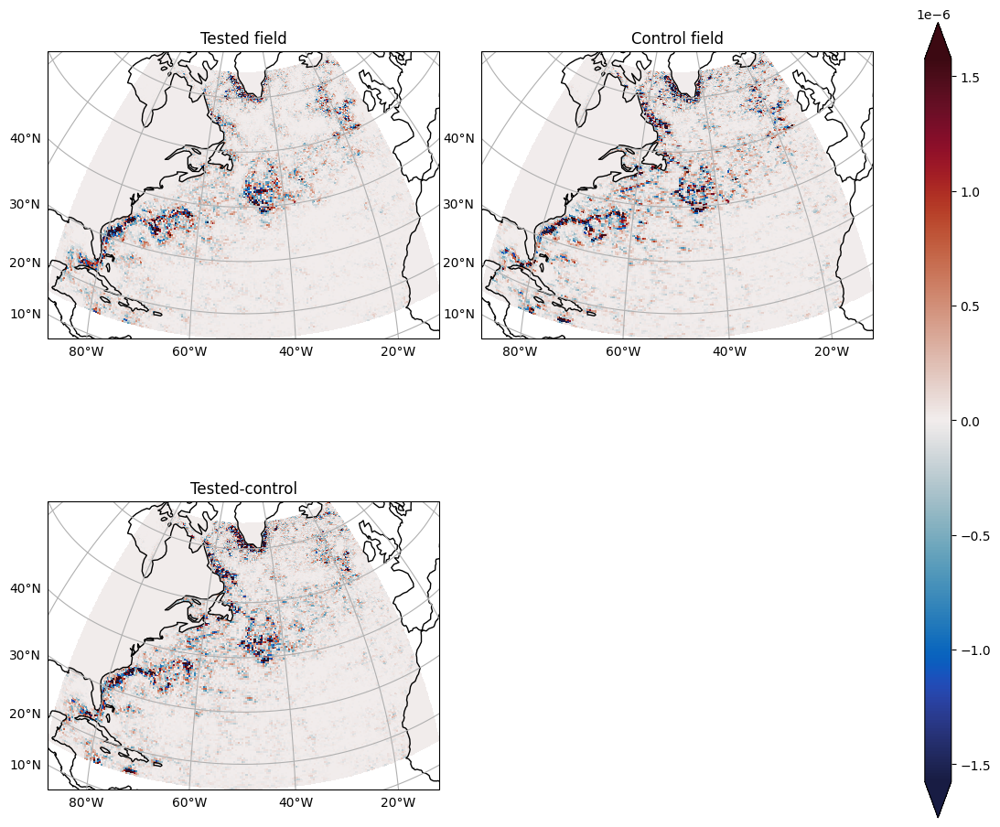

In [36]:
compare(pred['ZB20u'], SGS0.data.SGSx)

Correlation: 0.49400824368798124
Relative Error: 0.9544962355774236
R2 =  0.17845278811744292
R2 max =  0.24402775419237432
Optinal scaling: 0.6585960469646259
Nans [test/control]: [0, 0]


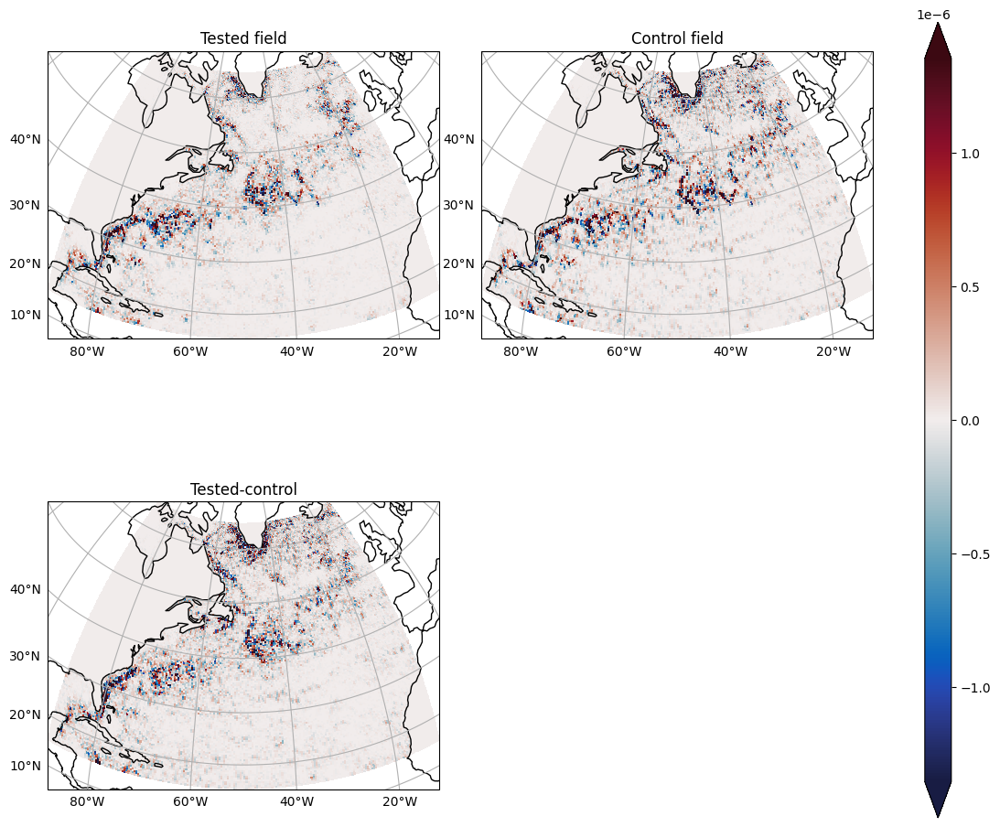

In [34]:
compare(pred['ZB20v'], SGS0.data.SGSy)

In [68]:
pred_nov17 = SFS0.state.ANN(ann_Txy_Nov17, ann_Txx_Tyy_Nov17)
pred_nov15 = SFS0.state.ANN(ann_Txy_Nov15, ann_Txx_Tyy_Nov15)

Correlation: 0.3973417006499294
Relative Error: 0.912510907230405
R2 =  0.14996926228297824
R2 max =  0.1578699063713067
Optinal scaling: 1.288175117839109
Nans [test/control]: [0, 0]


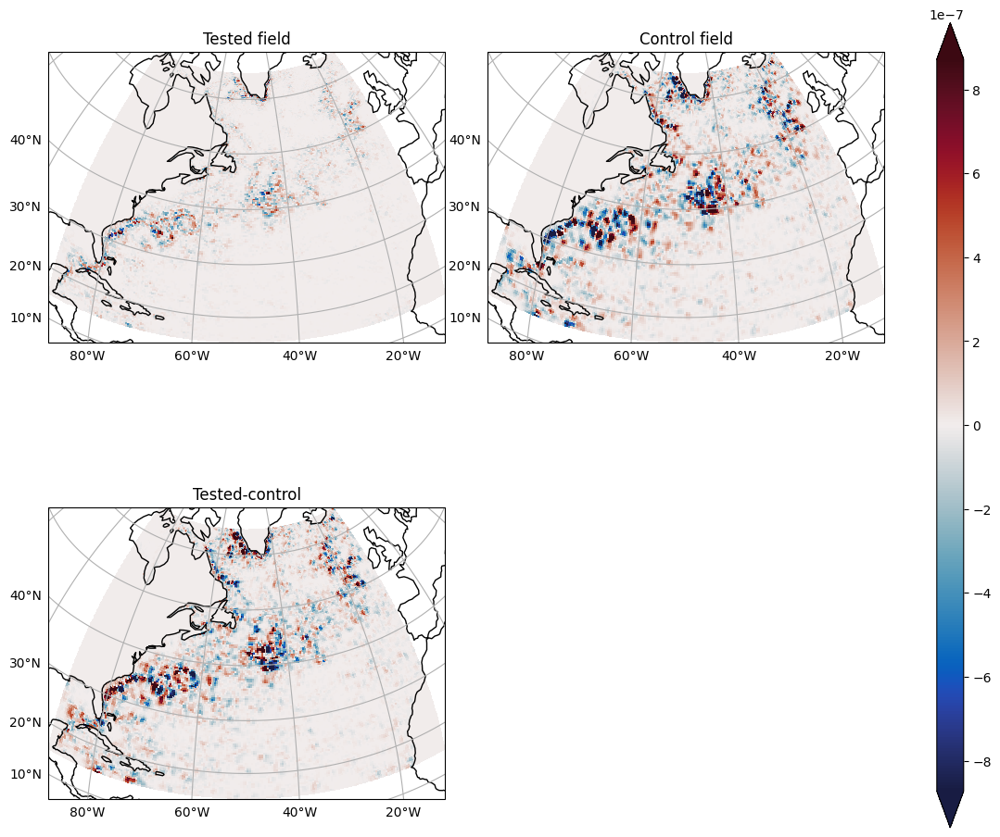

In [38]:
compare(pred['ZB20u'], SFS0.data.SGSx)

Correlation: 0.4513425420811894
Relative Error: 0.907457209891898
R2 =  0.18755624582007224
R2 max =  0.20372334019812466
Optinal scaling: 1.3921869660333444
Nans [test/control]: [0, 0]


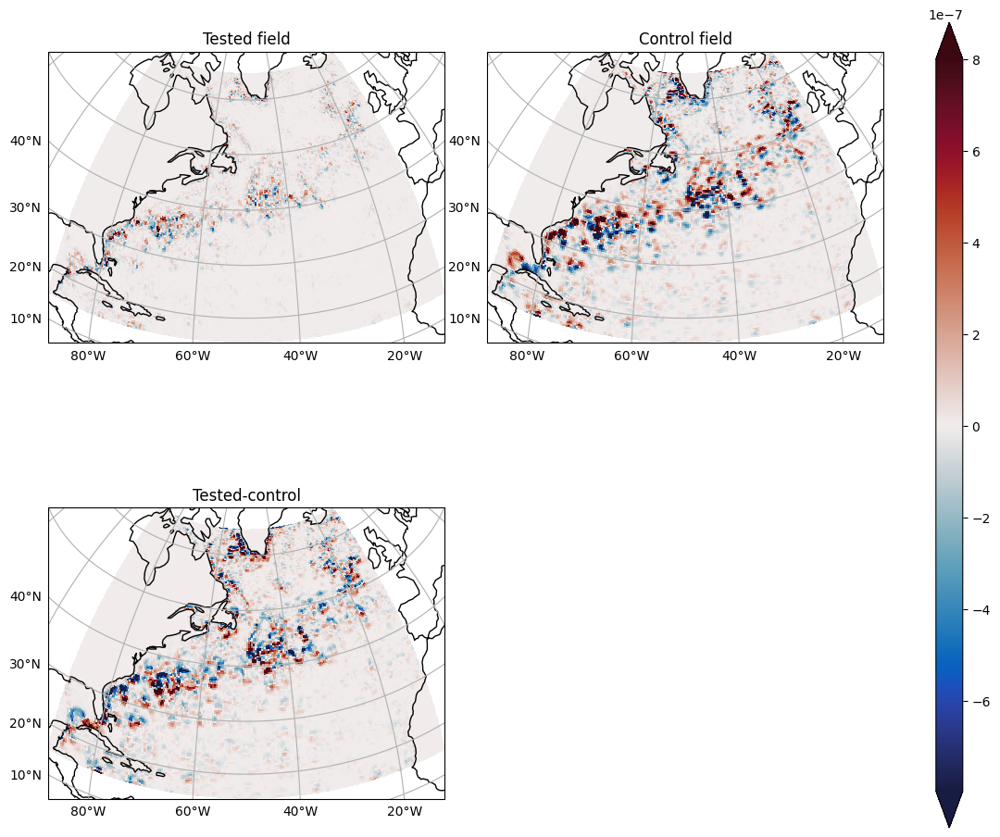

In [39]:
compare(pred['ZB20v'], SFS0.data.SGSy)

In [35]:
pred_colloc = SFS0.state.ANN(None, None, ann_Tall_colloc)

Correlation: 0.8120421241271649
Relative Error: 0.5333516979974627
R2 =  0.6454590451886021
R2 max =  0.6594042750478768
Optinal scaling: 0.8730389311805481
Nans [test/control]: [0, 0]


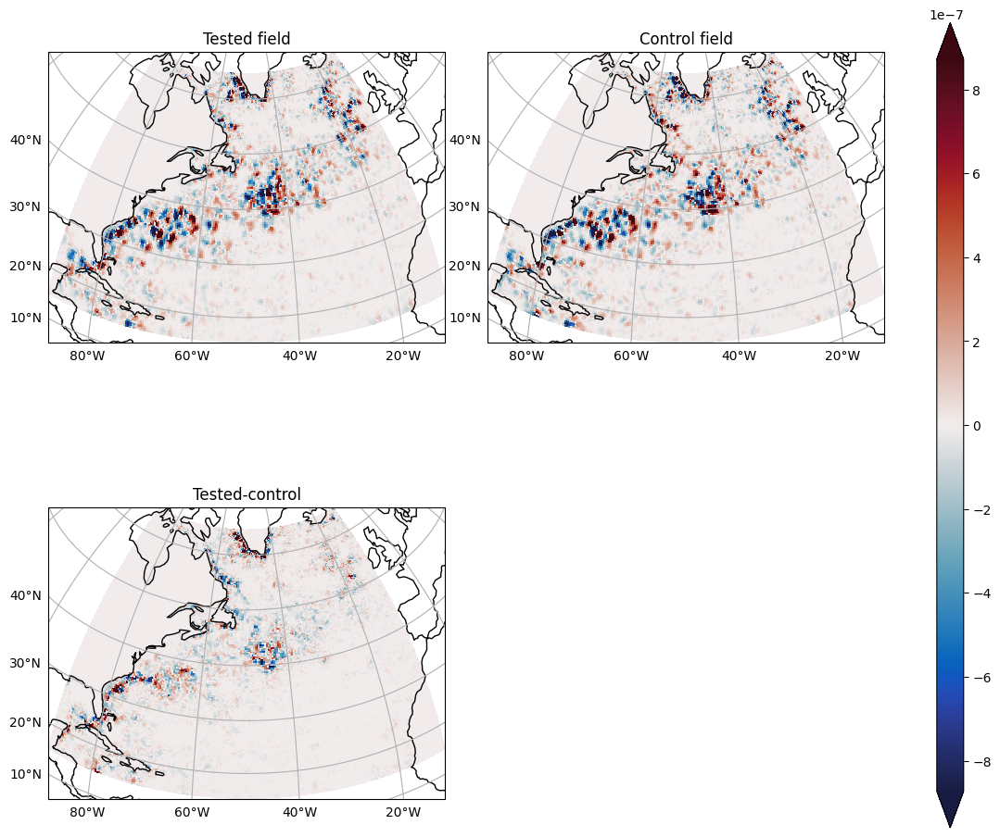

In [47]:
compare(pred_colloc['ZB20u'], SFS0.data.SGSx)

Correlation: 0.8075675687945442
Relative Error: 0.5329447915284345
R2 =  0.6220307889229955
R2 max =  0.6521637260839593
Optinal scaling: 0.8230774746629919
Nans [test/control]: [0, 0]


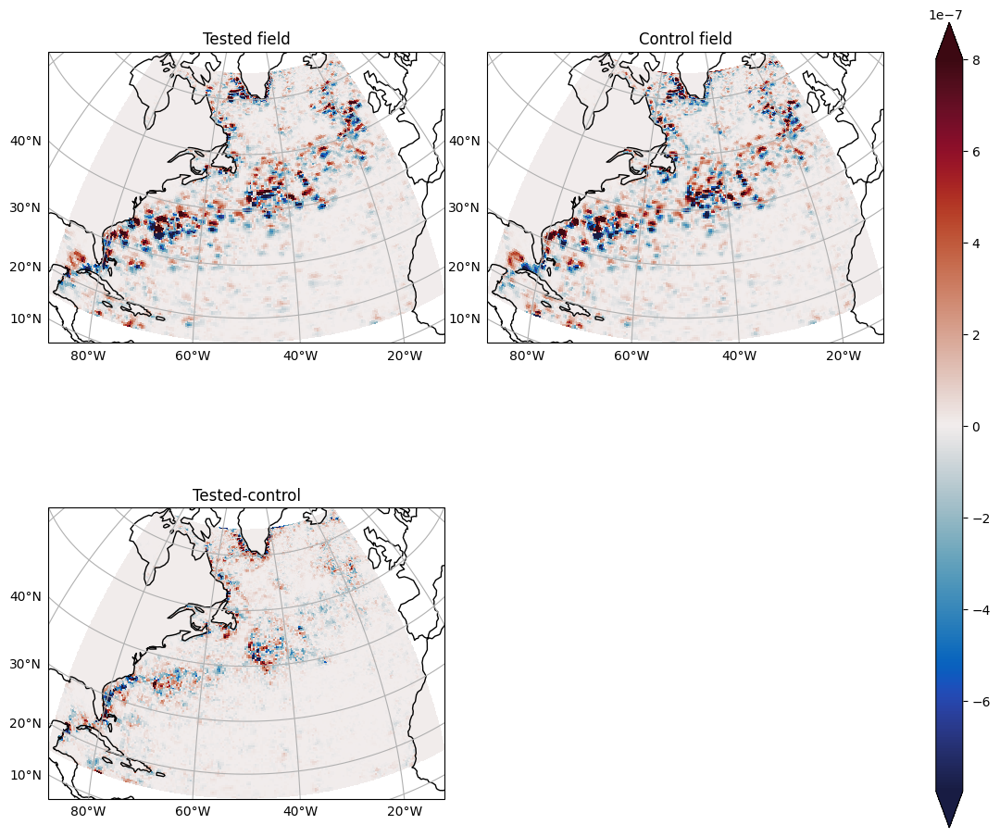

In [48]:
compare(pred_colloc['ZB20v'], SFS0.data.SGSy)

In [36]:
pred_stag = SFS0.state.ANN(ann_Txy_stag, ann_Txx_Tyy_stag)

Correlation: 0.8093129536170856
Relative Error: 0.5323096998884383
R2 =  0.632609418708455
R2 max =  0.6549789935941526
Optinal scaling: 0.8440203026984708
Nans [test/control]: [0, 0]


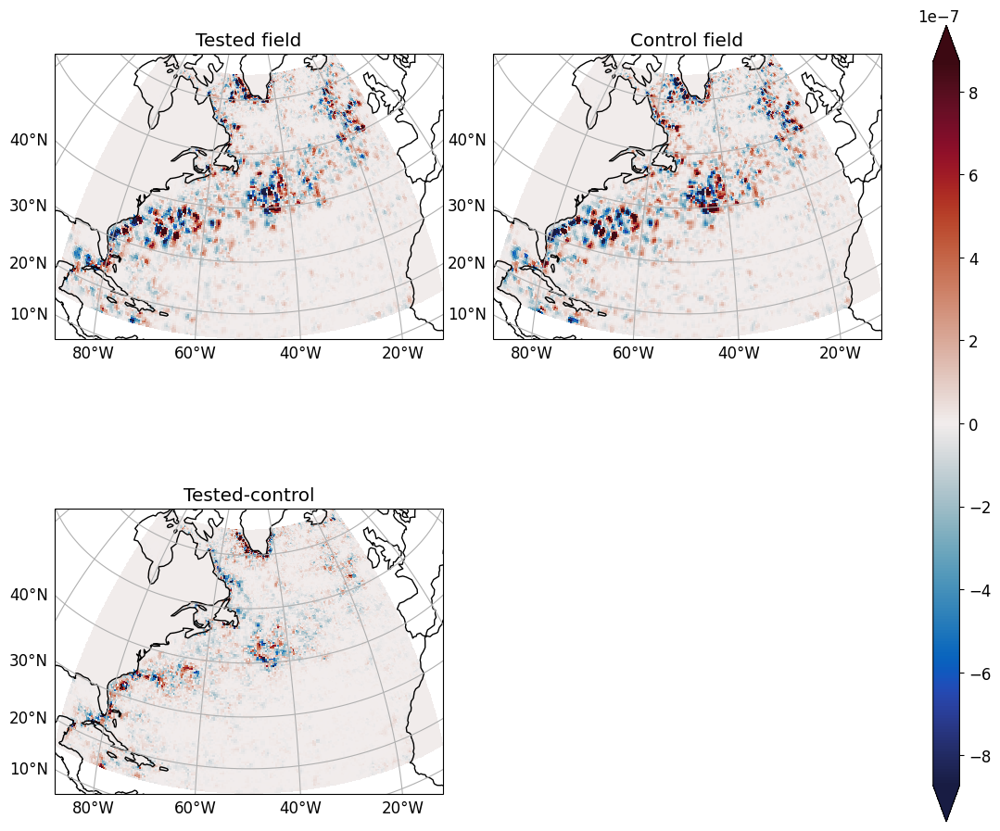

In [37]:
compare(pred_stag['ZB20u'], SFS0.data.SGSx)

Correlation: 0.7989616904890541
Relative Error: 0.5281579471910433
R2 =  0.59909100557315
R2 max =  0.6383374479844119
Optinal scaling: 0.8013101690367662
Nans [test/control]: [0, 0]


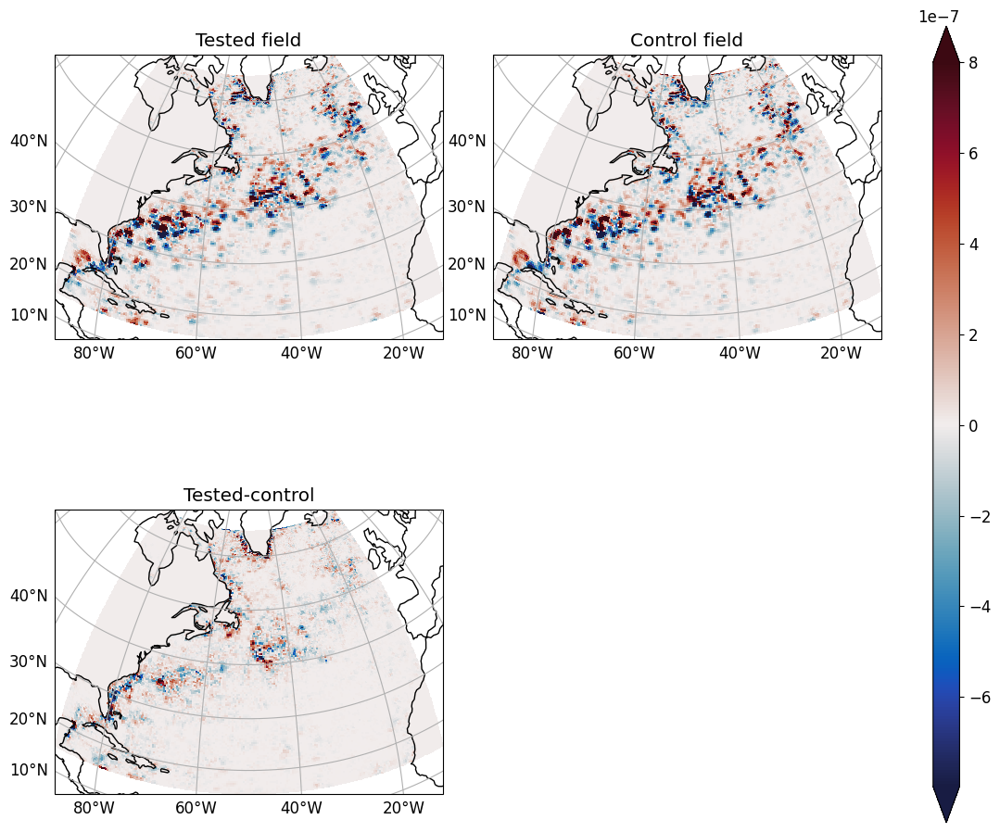

In [38]:
compare(pred_stag['ZB20v'], SFS0.data.SGSy)

Correlation: 0.9320871096445194
Relative Error: 0.37233772839822177
R2 =  0.8687866655496743
R2 max =  0.868786830432237
Optinal scaling: 1.000435832877347
Nans [test/control]: [0, 0]


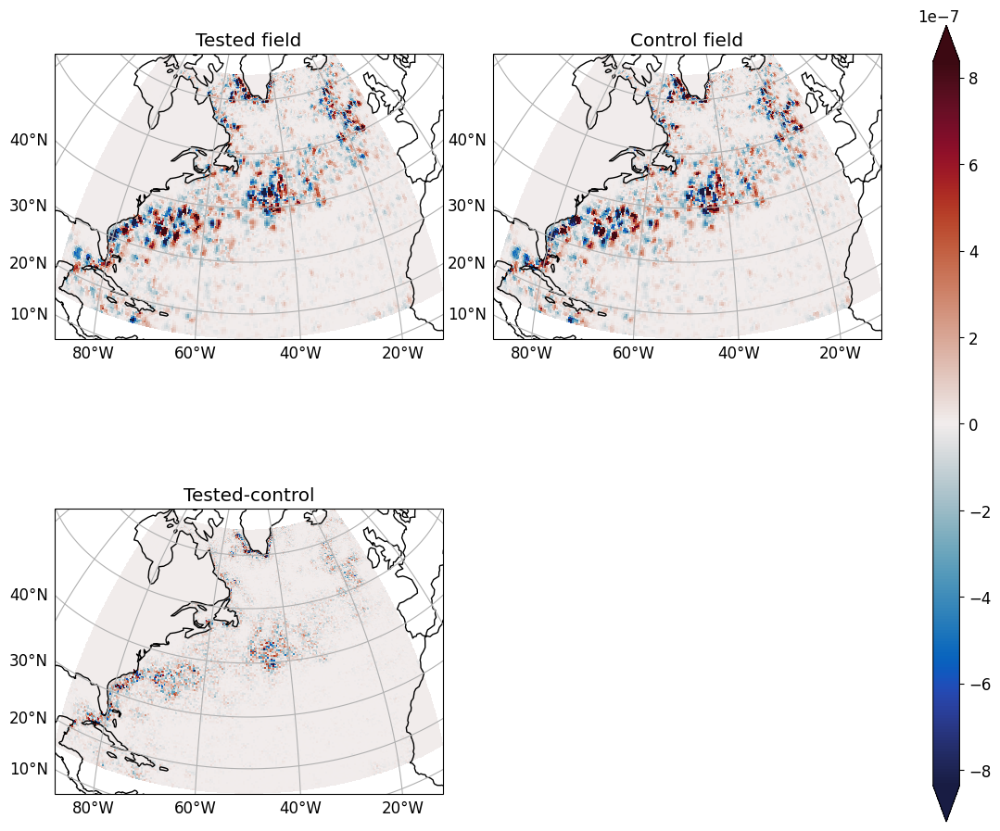

In [39]:
compare(pred_colloc['ZB20u'], pred_stag['ZB20u'])

Correlation: 0.9270680156816825
Relative Error: 0.36194942161673027
R2 =  0.8582160822085849
R2 max =  0.8594771383909691
Optinal scaling: 0.9631085854852666
Nans [test/control]: [0, 0]


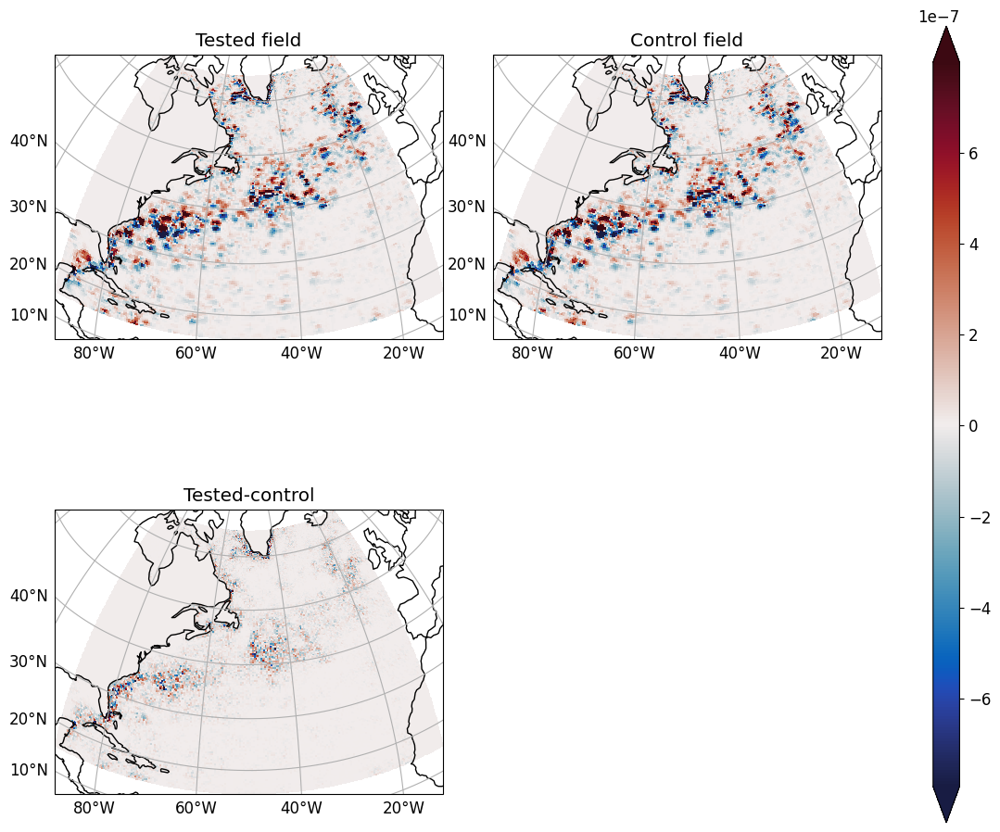

In [40]:
compare(pred_colloc['ZB20v'], pred_stag['ZB20v'])

Correlation: 0.9408377854403771
Relative Error: 0.2687428220871157
R2 =  0.9001697726268546
R2 max =  0.9002133302145161
Optinal scaling: 1.0070047186378535
Nans [test/control]: [0, 0]


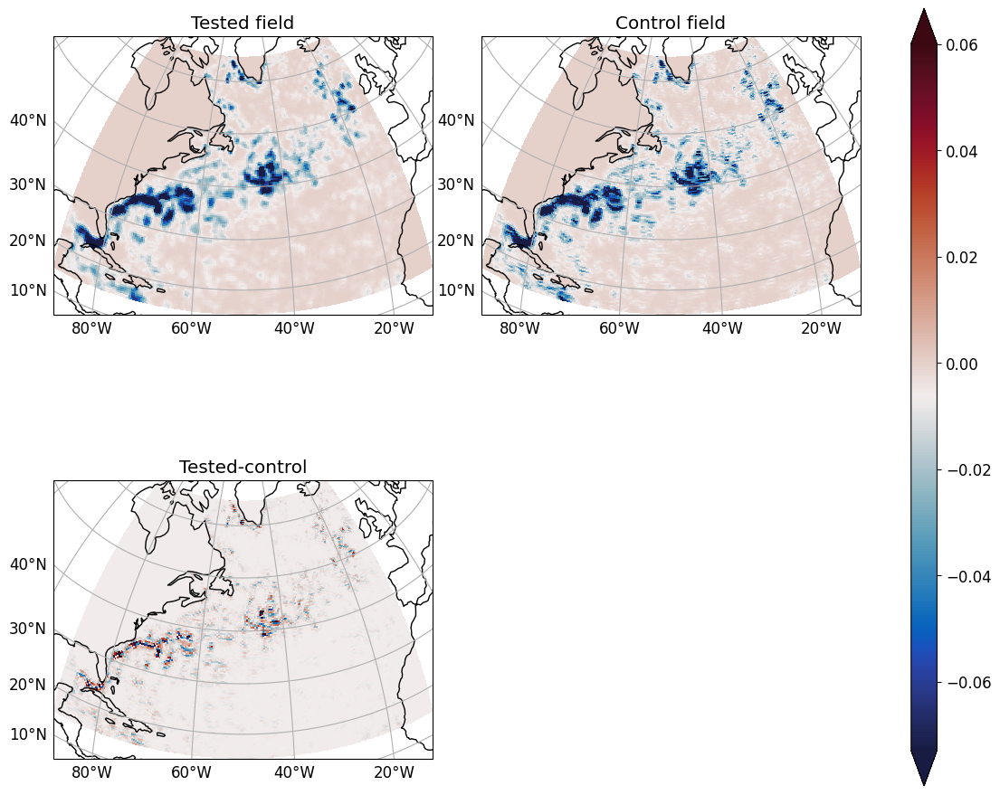

In [41]:
compare(pred_colloc['Txx'], pred_stag['Txx'])

Correlation: 0.8324888908971877
Relative Error: 0.8233258193491806
R2 =  0.3115671445972995
R2 max =  0.7251401063324328
Optinal scaling: 4.085057994428675
Nans [test/control]: [0, 0]


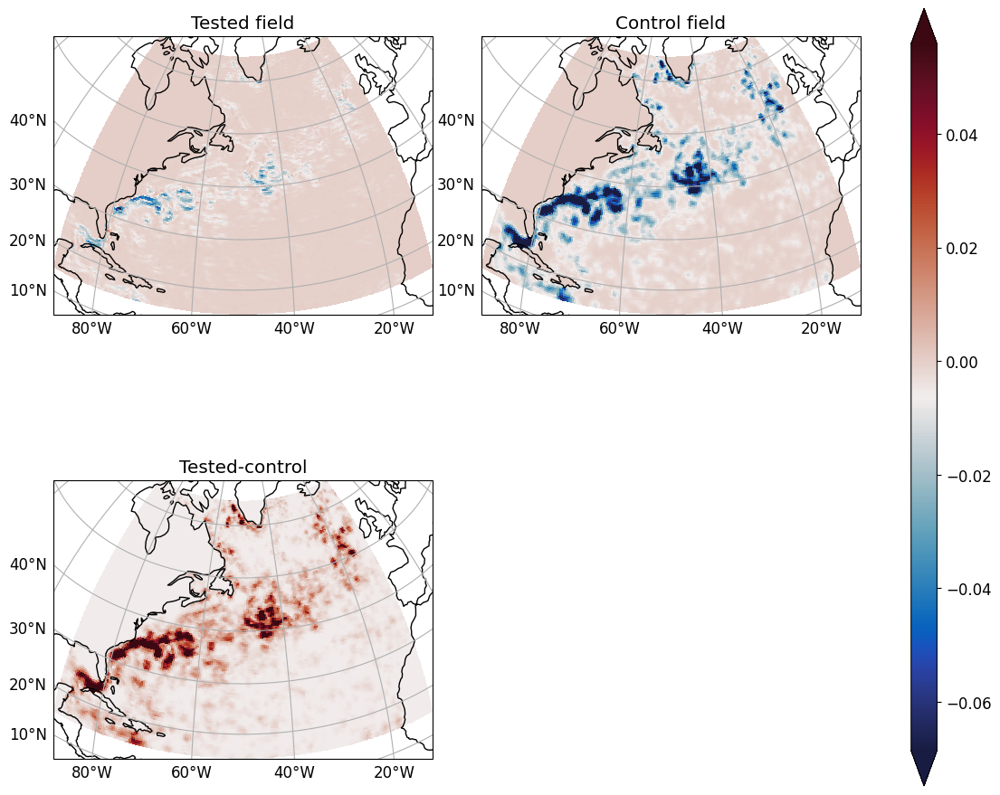

In [63]:
compare(pred_nov17['Txx'], pred_colloc['Txx'])

Correlation: 0.8688278817032045
Relative Error: 2.8010214486621114
R2 =  -7.778453203731273
R2 max =  0.7549172567157874
Optinal scaling: 0.2292473821167516
Nans [test/control]: [0, 0]


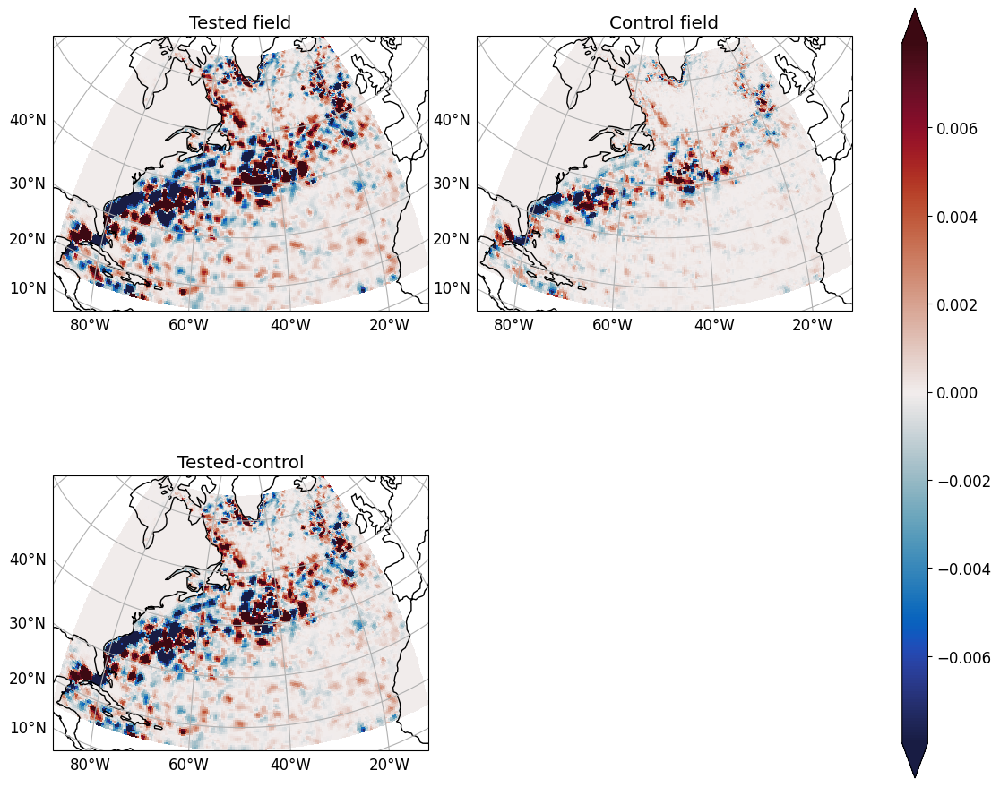

In [65]:
compare(pred_colloc['Txy'], pred_nov17['Txy'])

Correlation: 0.9535009284728427
Relative Error: 0.3139527697358313
R2 =  0.9029527667033946
R2 max =  0.918085111031481
Optinal scaling: 0.886222959622889
Nans [test/control]: [0, 0]


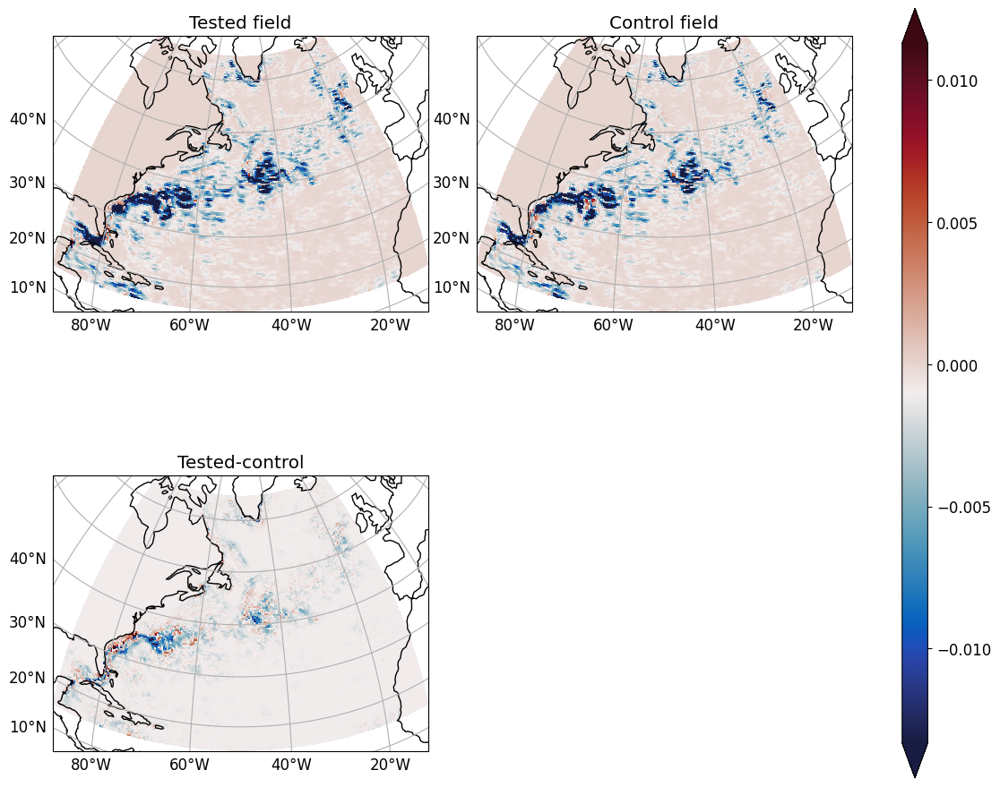

In [69]:
compare(pred_nov17['Txx'], pred_nov15['Txx'])

Correlation: 0.9565552743434173
Relative Error: 0.3378165424170208
R2 =  0.9176454618106369
R2 max =  0.9215510079220262
Optinal scaling: 0.938878951138539
Nans [test/control]: [0, 0]


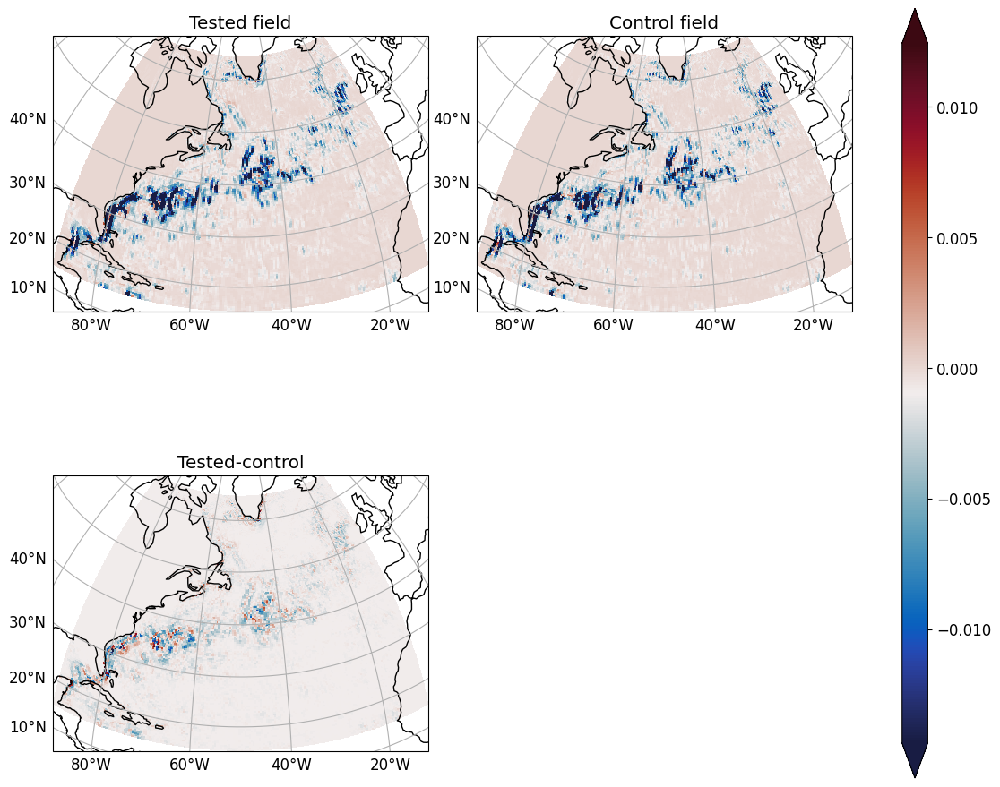

In [70]:
compare(pred_nov17['Tyy'], pred_nov15['Tyy'])

Correlation: 0.950189053575204
Relative Error: 0.31554820252558885
R2 =  0.9010432766995623
R2 max =  0.9028488569285561
Optinal scaling: 0.9571943594982266
Nans [test/control]: [0, 0]


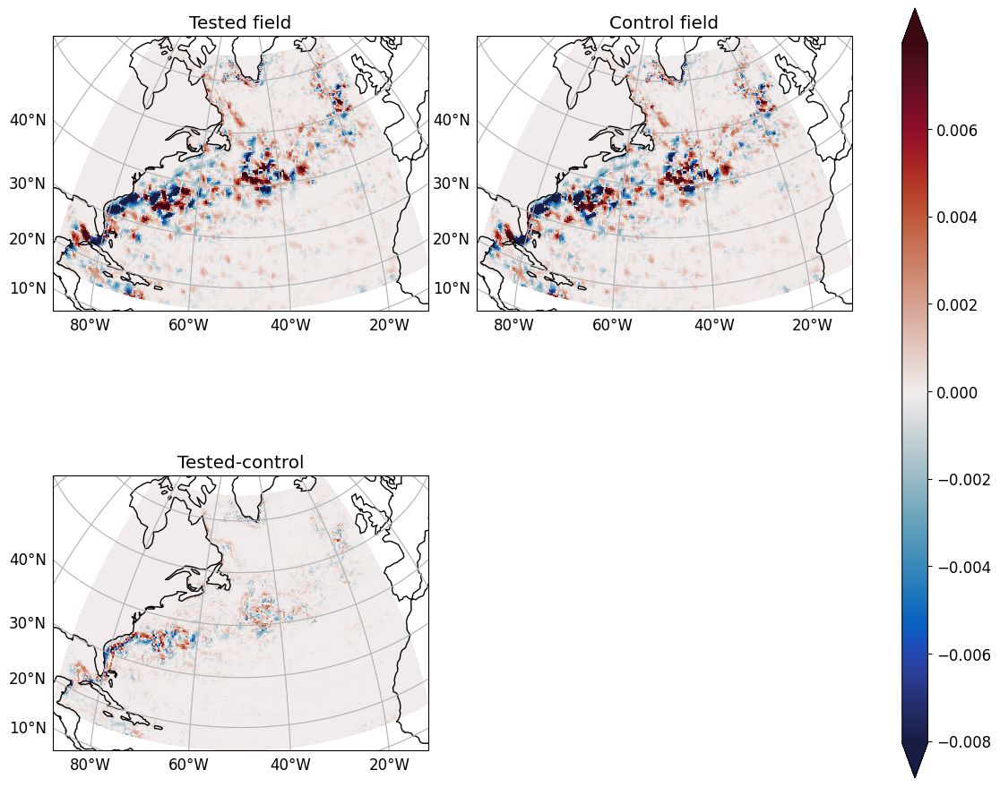

In [71]:
compare(pred_nov17['Txy'], pred_nov15['Txy'])

Correlation: 0.8063790722589531
Relative Error: 0.5669834868105603
R2 =  0.566779797821342
R2 max =  0.6502538517790122
Optinal scaling: 0.7362199850373401
Nans [test/control]: [0, 0]


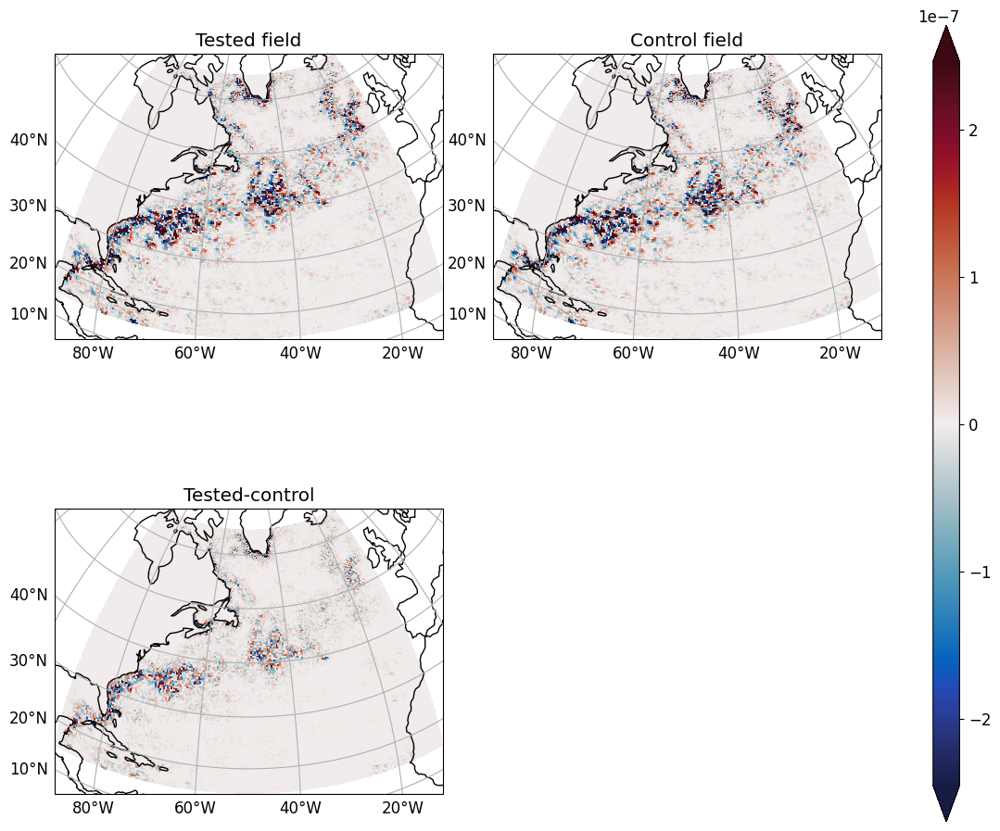

In [72]:
compare(pred_nov17['ZB20u'], pred_nov15['ZB20u'])

Correlation: 0.9335115428383516
Relative Error: 0.28424862902493836
R2 =  0.8854248848485559
R2 max =  0.8864662131399128
Optinal scaling: 1.0354902242322521
Nans [test/control]: [0, 0]


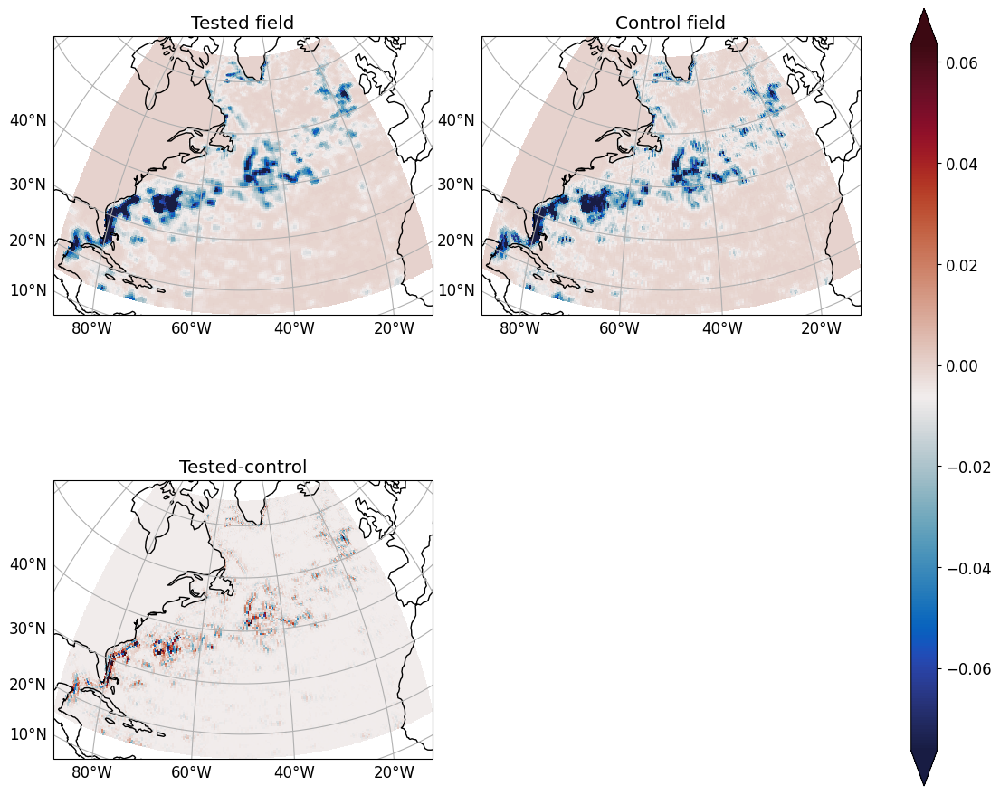

In [42]:
compare(pred_colloc['Tyy'], pred_stag['Tyy'])

Correlation: 0.8770094897430052
Relative Error: 0.5286943025834269
R2 =  0.7657250249891855
R2 max =  0.7692103476530772
Optinal scaling: 0.9369322790043171
Nans [test/control]: [0, 0]


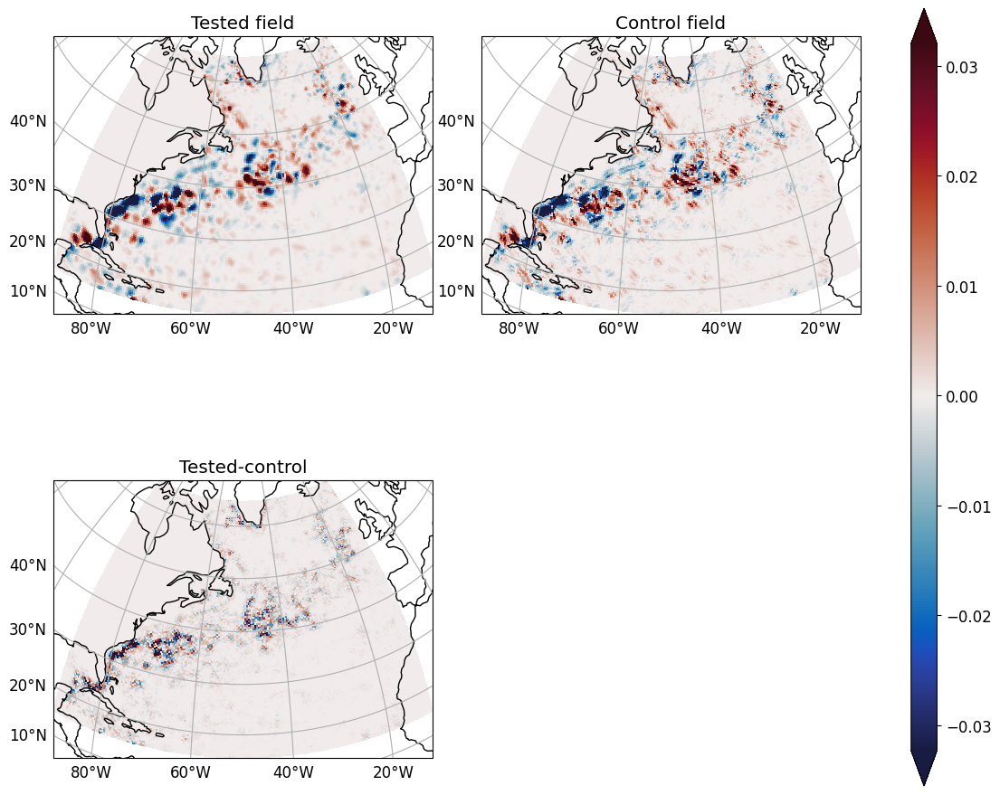

In [46]:
compare(pred_colloc['Txy'], pred_stag['Txy'])

In [54]:
pred_exp1 = SFS0.state.ANN(ann_Txy_exp1, ann_Txx_Tyy_exp1)

Correlation: 0.927412168512018
Relative Error: 0.40952685689744406
R2 =  0.8576992195291071
R2 max =  0.8601337692511639
Optinal scaling: 0.9494856542507621
Nans [test/control]: [0, 0]


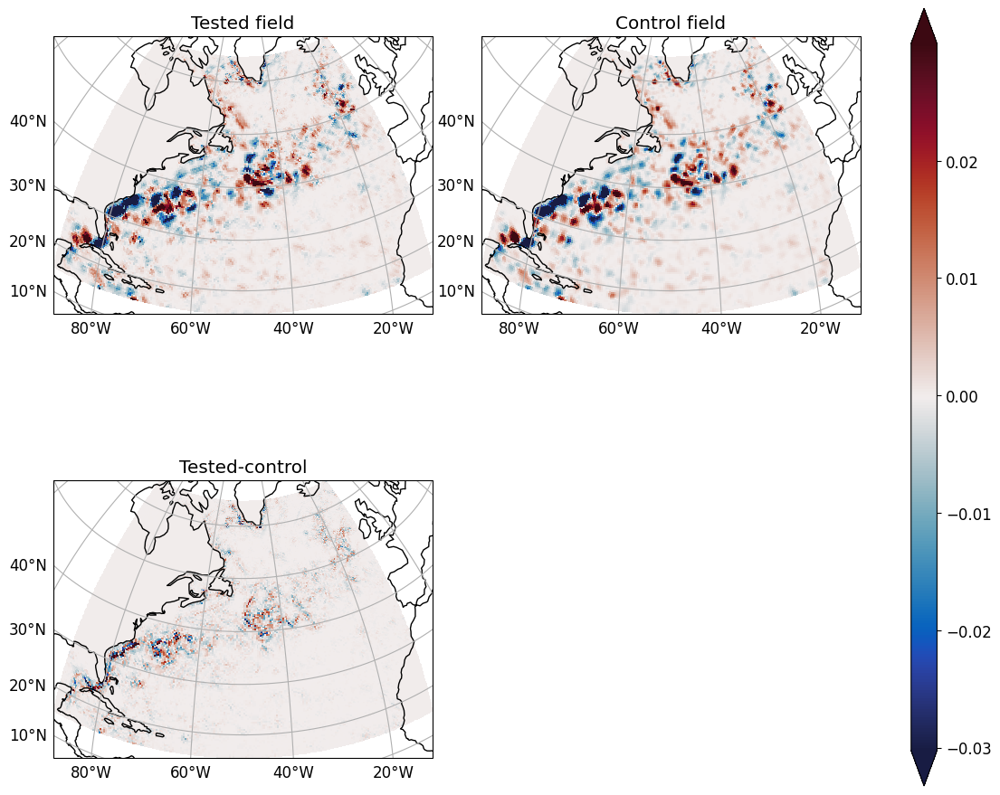

In [55]:
compare(pred_exp1['Txy'], pred_colloc['Txy'])

Correlation: 0.9737960620589264
Relative Error: 0.1814214383659291
R2 =  0.9540523305561142
R2 max =  0.9555269157930221
Optinal scaling: 0.9622010861078585
Nans [test/control]: [0, 0]


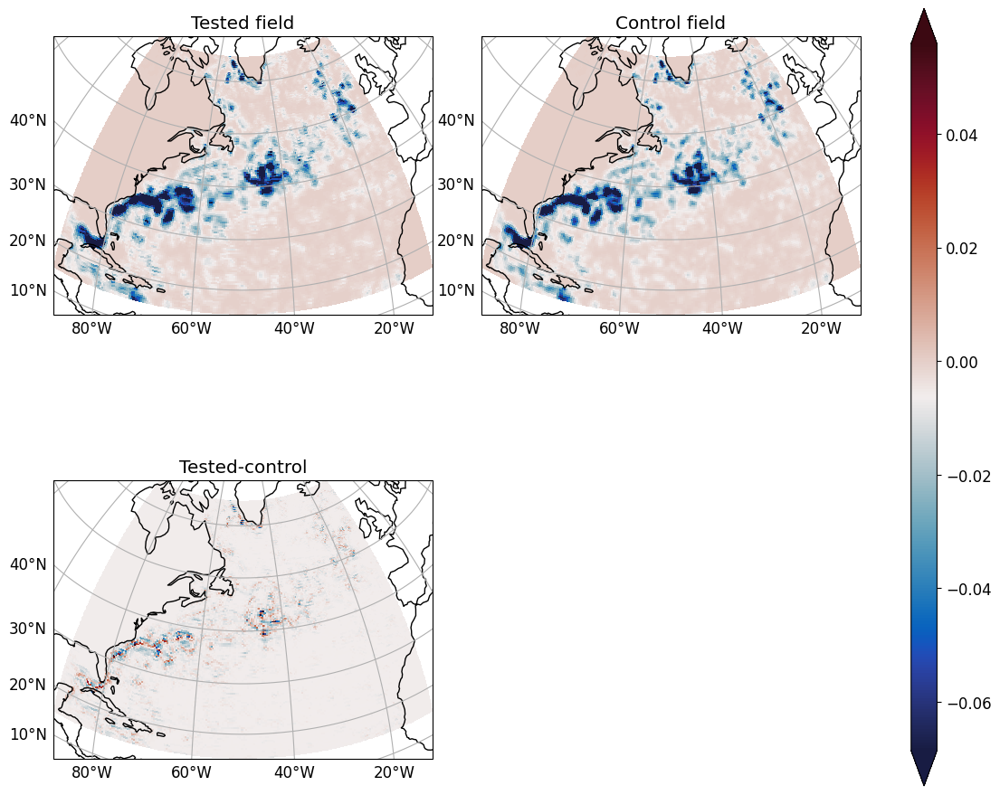

In [81]:
compare(pred_exp1['Txx'], pred_colloc['Txx'])

Correlation: 0.9621068077049724
Relative Error: 0.22459522327349354
R2 =  0.9266253757724241
R2 max =  0.9347113161090864
Optinal scaling: 0.9149052734842632
Nans [test/control]: [0, 0]


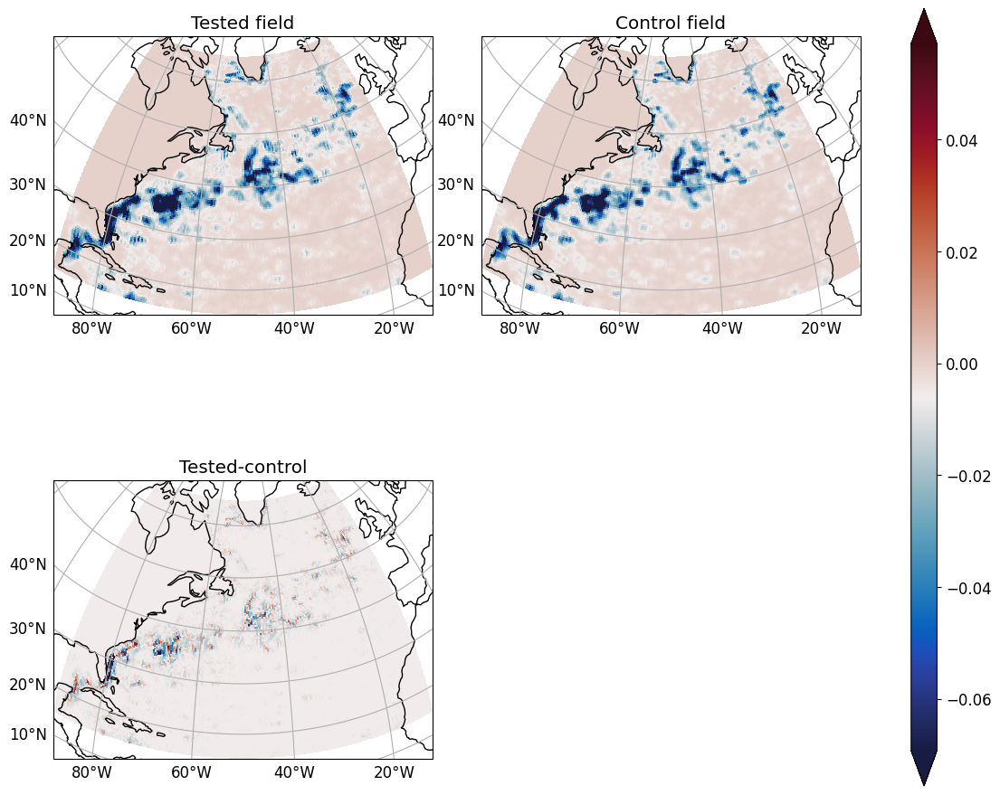

In [82]:
compare(pred_exp1['Tyy'], pred_colloc['Tyy'])

In [44]:
pred_short = SFS0.state.ANN(ann_Txy_short, ann_Txx_Tyy_short)

Correlation: 0.8464875718787532
Relative Error: 0.5194566707456117
R2 =  0.7134821381442378
R2 max =  0.7165427181585582
Optinal scaling: 0.9386539853520207
Nans [test/control]: [0, 0]


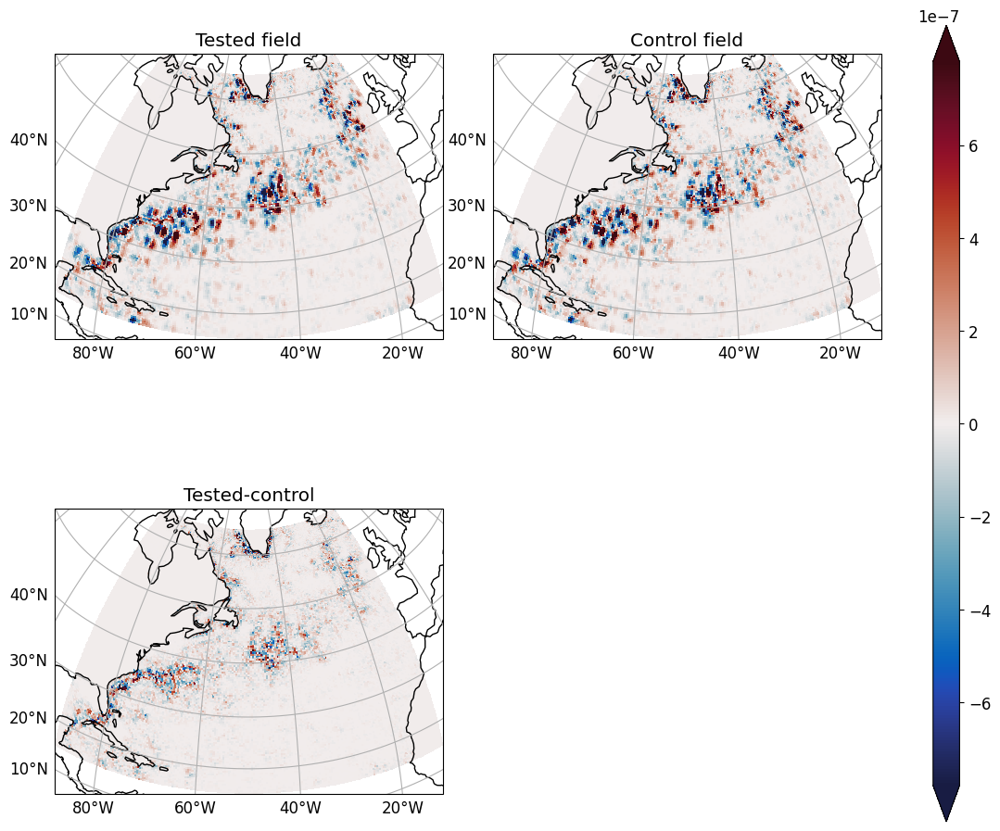

In [47]:
compare(pred_short['ZB20u'], pred_colloc['ZB20u'])

Correlation: 0.8125329577425966
Relative Error: 0.5382977862892075
R2 =  0.6535676335092676
R2 max =  0.6602657823781826
Optinal scaling: 0.9084958195617745
Nans [test/control]: [0, 0]


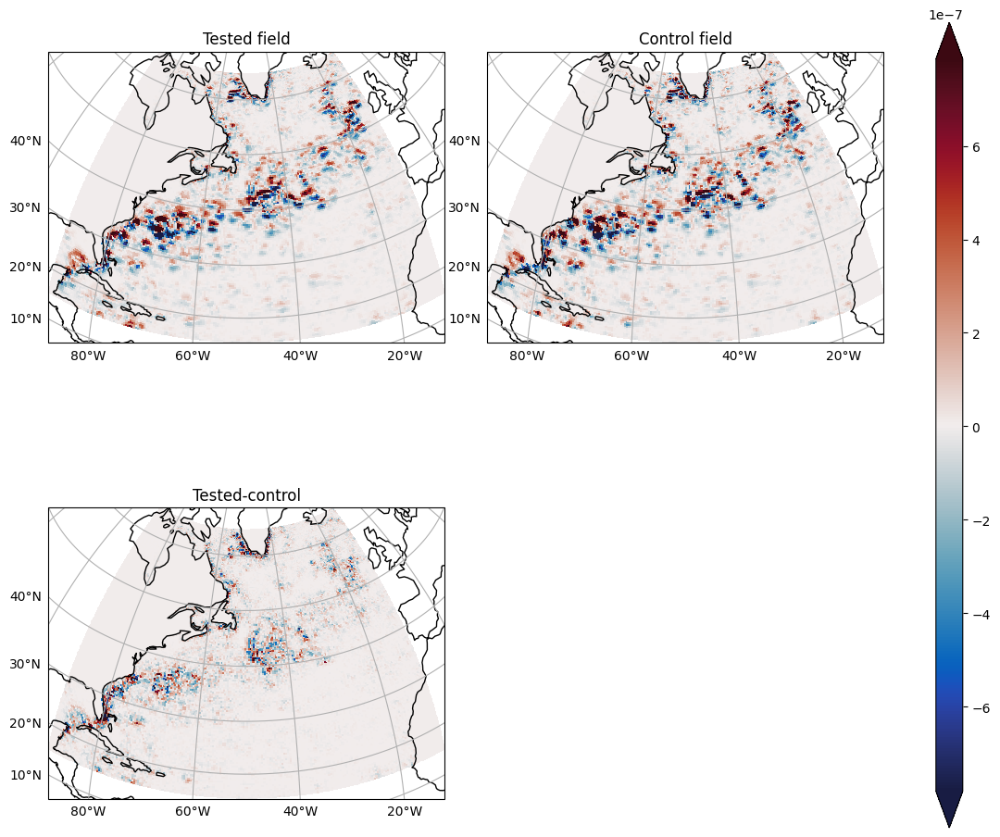

In [56]:
compare(pred_short['ZB20v'], pred_colloc['ZB20v'])

Correlation: 0.9345566927519836
Relative Error: 0.42212584919050705
R2 =  0.8679913923612719
R2 max =  0.8734201289512455
Optinal scaling: 1.0855858483313452
Nans [test/control]: [0, 0]


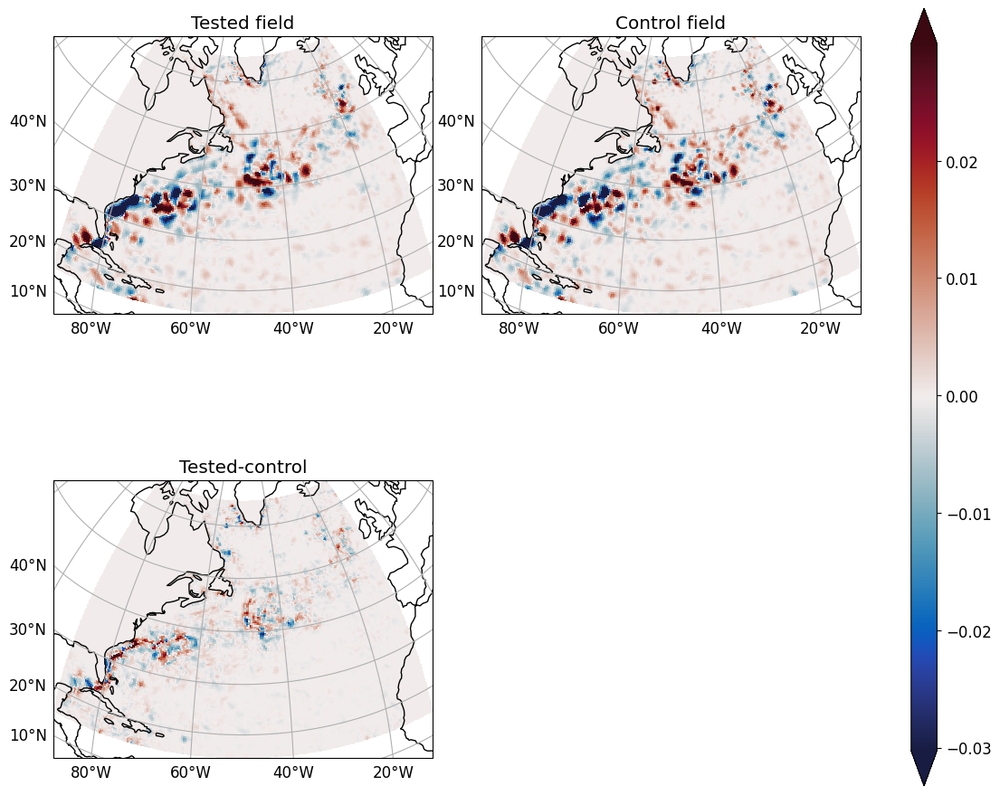

In [50]:
compare(pred_short['Txy'], pred_colloc['Txy'])

# Short waves, collocated and staggered in terms of transfer?

In [8]:
def read_skill(exp='EXP0', factors=[4,9,12,15], base_path='/scratch/pp2681/mom6/CM26_ML_models/ocean3d/Gauss-FGR3'):
    ds = {}
    for factor in factors:
        data = xr.open_dataset(f'{base_path}/{exp}/skill-test/factor-{factor}.nc', chunks={'zl':1})
        data['zl'] = -data['zl']
        ds[factor] = data
        
    return ds

In [9]:
def backscatter_ratio(transfer, freq_str):
    transfer_noncompensated = transfer / transfer[freq_str]
    transfer_plus = np.maximum(transfer_noncompensated,0.0)
    transfer_minus =  np.minimum(transfer_noncompensated,0.0)
    return -transfer_plus.sum(freq_str) / transfer_minus.sum(freq_str)

In [10]:
def plot_transfer(transfer, freq_str='freq_r_NA', zl=0, color='tab:blue'):
    mean = transfer.mean('time').isel(zl=zl)
    std = transfer.std('time').isel(zl=zl)
    
    mean.plot(xscale='log',color=color,lw=2)
    plt.fill_between(mean[freq_str],mean-std,mean+std,alpha=0.05,color=color, linewidth=0)
    return backscatter_ratio(mean,freq_str)

In [11]:
def plot_transfer_4_regions(exps=[],zl=5,factor=4,labels=[]):
    plt.figure(figsize=(10,8))
    plt.rcParams['font.size']=12

    colors= ['tab:blue', 'tab:orange', 'tab:green', 'tab:red', 'tab:pink']
    
    plt.subplot(2,2,1)
    ratio = plot_transfer(exps[0][factor].transfer_NA,'freq_r_NA',color='k',zl=zl)
    for exp, color in zip(exps, colors):
        plot_transfer(exp[factor].transfer_ZB_NA,'freq_r_NA',zl=zl,color=color)
    plt.ylabel('Compensated energy transfer m$^2$/s$^3$')
    plt.title('North Atlantic')
    plt.axhline(y=0,color='gray')
    plt.xlabel('Wavenumber, m$^{-1}$')
    plt.axvline(x=1/(22.6e+3), color='tab:gray', ls='--')
    plt.xlim([1e-6,2e-4])
    plt.text(1e-5, 0, 'Backscat ratio: %.1f' % float(ratio))

    plt.subplot(2,2,2)
    ratio=plot_transfer(exps[0][factor].transfer_Pacific,'freq_r_Pacific',color='k',zl=zl)
    for exp, color in zip(exps,colors):
        plot_transfer(exp[factor].transfer_ZB_Pacific,'freq_r_Pacific',zl=zl,color=color)
    plt.ylabel('Compensated energy transfer m$^2$/s$^3$')
    plt.title('Pacific')
    plt.axhline(y=0,color='gray')
    plt.xlabel('Wavenumber, m$^{-1}$')
    plt.axvline(x=1/(28.5e+3), color='tab:gray', ls='--')
    plt.xlim([1e-6,2e-4])
    plt.text(1e-5, 0, 'Backscat ratio: %.1f' % float(ratio))
    
    plt.subplot(2,2,3)
    ratio=plot_transfer(exps[0][factor].transfer_ACC,'freq_r_ACC',color='k',zl=zl)
    for exp,color in zip(exps,colors):
        plot_transfer(exp[factor].transfer_ZB_ACC,'freq_r_ACC',zl=zl,color=color)
    plt.ylabel('Compensated energy transfer m$^2$/s$^3$')
    plt.title('ACC')
    plt.axhline(y=0,color='gray')
    plt.xlabel('Wavenumber, m$^{-1}$')
    plt.axvline(x=1/(10.5e+3), color='tab:gray',ls='--')
    plt.xlim([1e-6,2e-4])
    plt.text(1e-5, 0, 'Backscat ratio: %.1f' % float(ratio))
        
    plt.subplot(2,2,4)
    ratio=plot_transfer(exps[0][factor].transfer_Equator,'freq_r_Equator',color='k',zl=zl)
    for exp,color in zip(exps,colors):
        plot_transfer(exp[factor].transfer_ZB_Equator,'freq_r_Equator',zl=zl,color=color)
    plt.ylabel('Compensated energy transfer m$^2$/s$^3$')
    plt.title('Equator')
    plt.axhline(y=0,color='gray')
    plt.xlabel('Wavenumber, m$^{-1}$')
    plt.tight_layout()
    plt.axvline(x=1/(89.9e+3), color='tab:gray',ls='--')
    plt.xlim([1e-6,2e-4])
    plt.text(1e-5, 0, 'Backscat ratio: %.1f' % float(ratio))
    
    plt.plot(np.nan,np.nan,color='k',label='SFS')
    for label, color in zip(labels,colors):
        plt.plot(np.nan,np.nan,color=color,label=label)
    plt.plot(np.nan,np.nan,color='gray',ls='--',label='$1/R_d$')
    plt.legend(bbox_to_anchor=(1,1))
    
    plt.suptitle(f'Coarsegraining factor: {factor}, Depth: %.0f m' % (float(-exp[factor].zl[zl])), y=1.03)

In [248]:
exp_colloc = read_skill('Collocated-NN-params/hdn-64-64')
exp_stag = read_skill('EXP-32-32/staggered')
exp_short = read_skill('EXP-32-32/short_waves')

In [14]:
exp_nov17 = read_skill('Nov17', base_path='offline-skill-old-models')
exp_nov15 = read_skill('Nov15', base_path='offline-skill-old-models')
exp_fgr2_20 = read_skill('FGR2_20', base_path='offline-skill-old-models')
exp_fgr2_64_64 = read_skill('FGR2_64_64', base_path='offline-skill-old-models')

In [247]:
exp_colloc_8 = read_skill('Collocated-NN-params/hdn-8-8-8')
exp_colloc_128 = read_skill('Collocated-NN-params/hdn-128-128-128')

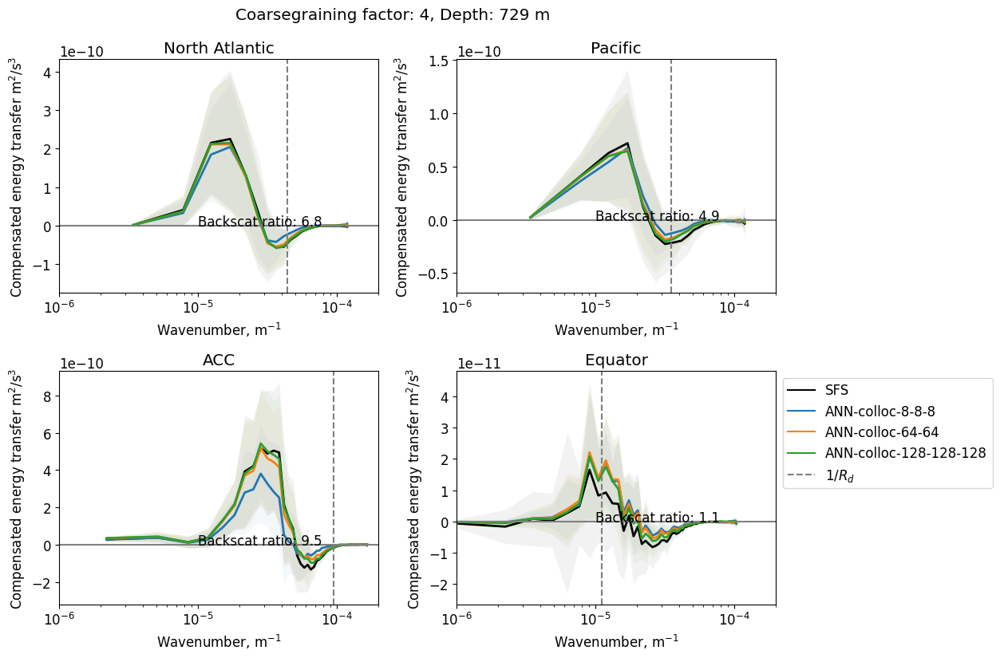

In [249]:
plot_transfer_4_regions([exp_colloc_8, exp_colloc, exp_colloc_128],labels=['ANN-colloc-8-8-8', 'ANN-colloc-64-64', 'ANN-colloc-128-128-128'])

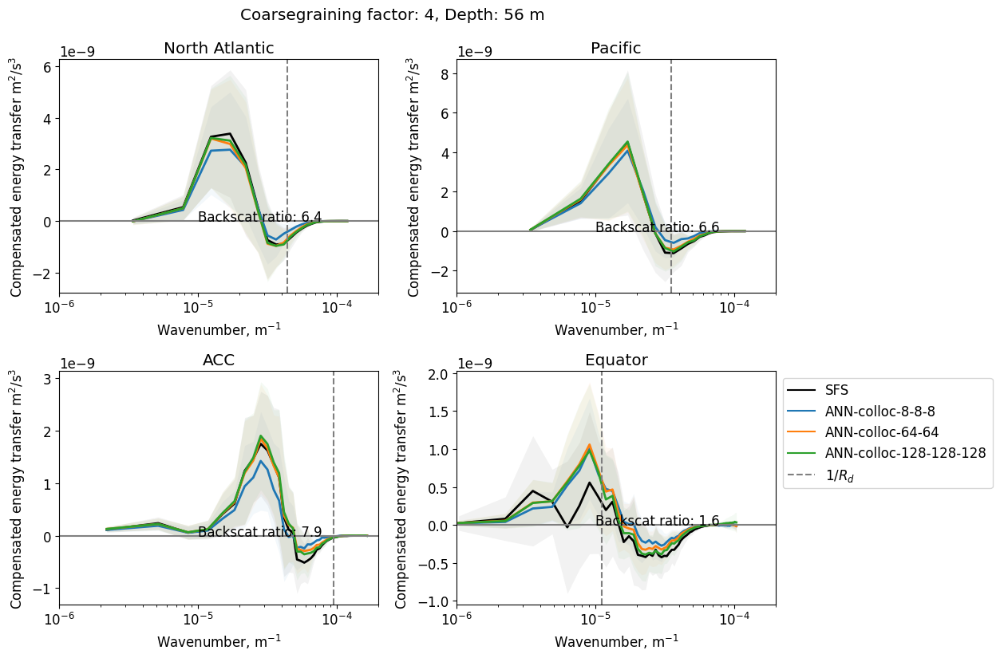

In [251]:
plot_transfer_4_regions([exp_colloc_8, exp_colloc, exp_colloc_128],labels=['ANN-colloc-8-8-8', 'ANN-colloc-64-64', 'ANN-colloc-128-128-128'], zl=1)

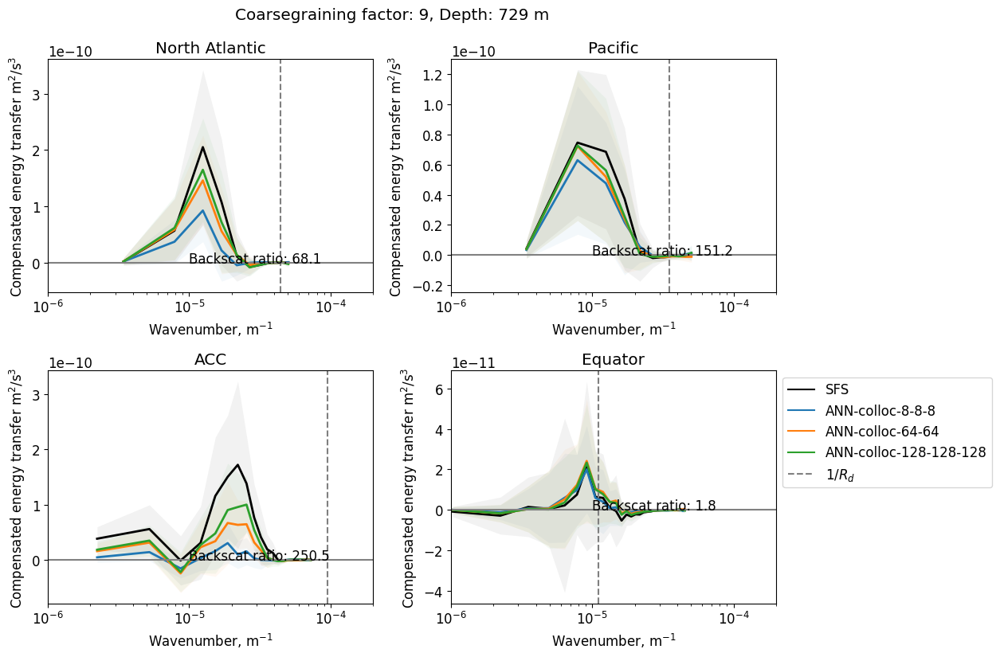

In [252]:
plot_transfer_4_regions([exp_colloc_8, exp_colloc, exp_colloc_128],labels=['ANN-colloc-8-8-8', 'ANN-colloc-64-64', 'ANN-colloc-128-128-128'], factor=9)

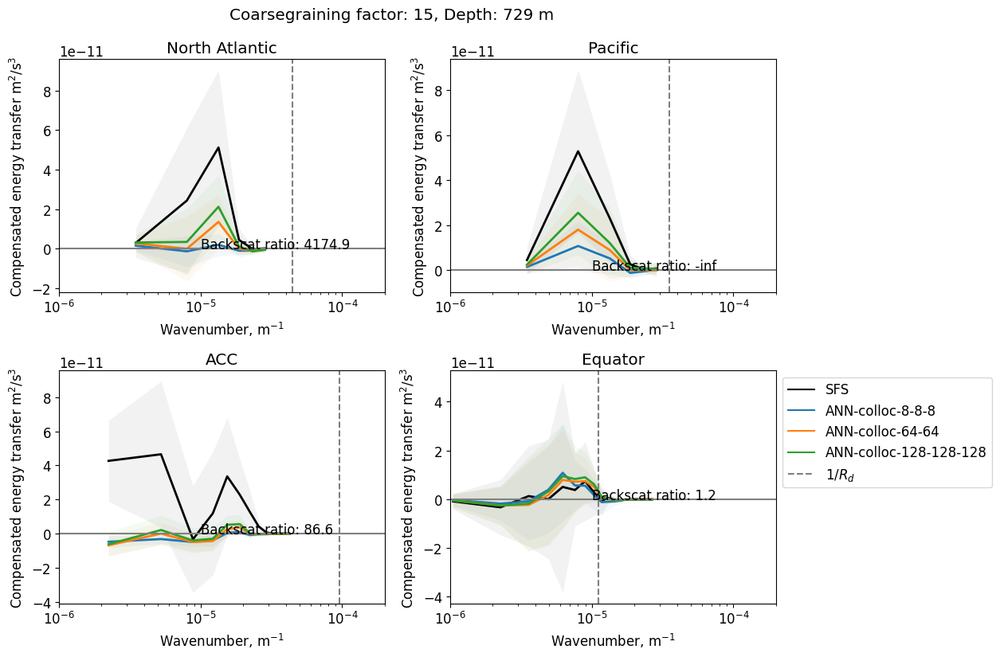

In [253]:
plot_transfer_4_regions([exp_colloc_8, exp_colloc, exp_colloc_128],labels=['ANN-colloc-8-8-8', 'ANN-colloc-64-64', 'ANN-colloc-128-128-128'], factor=15)

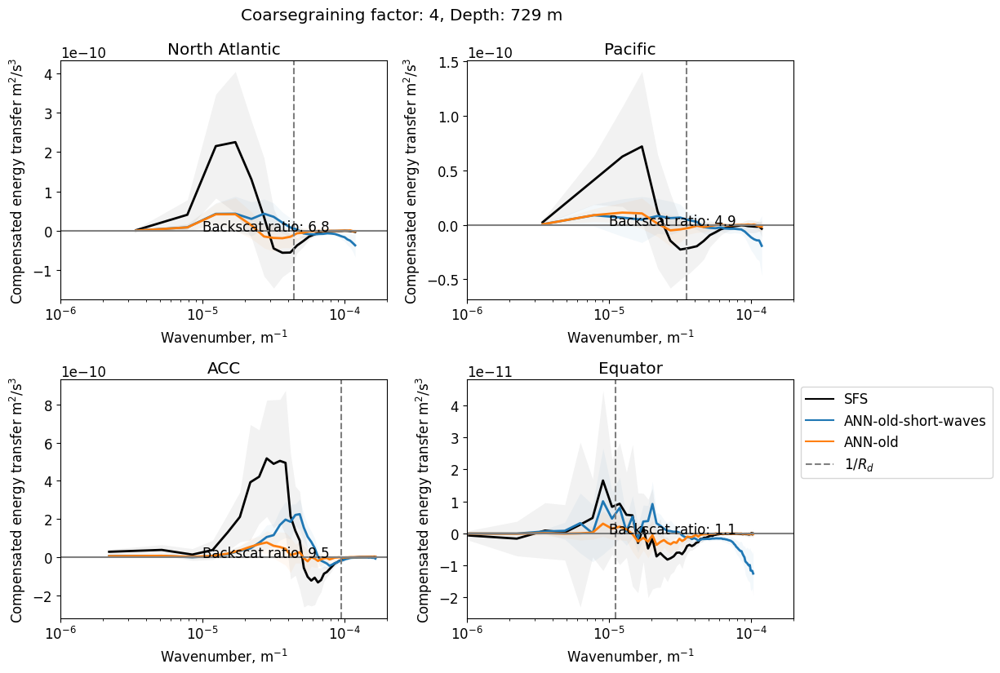

In [19]:
plot_transfer_4_regions([exp_nov17, exp_nov15],labels=['ANN-old-short-waves', 'ANN-old'])

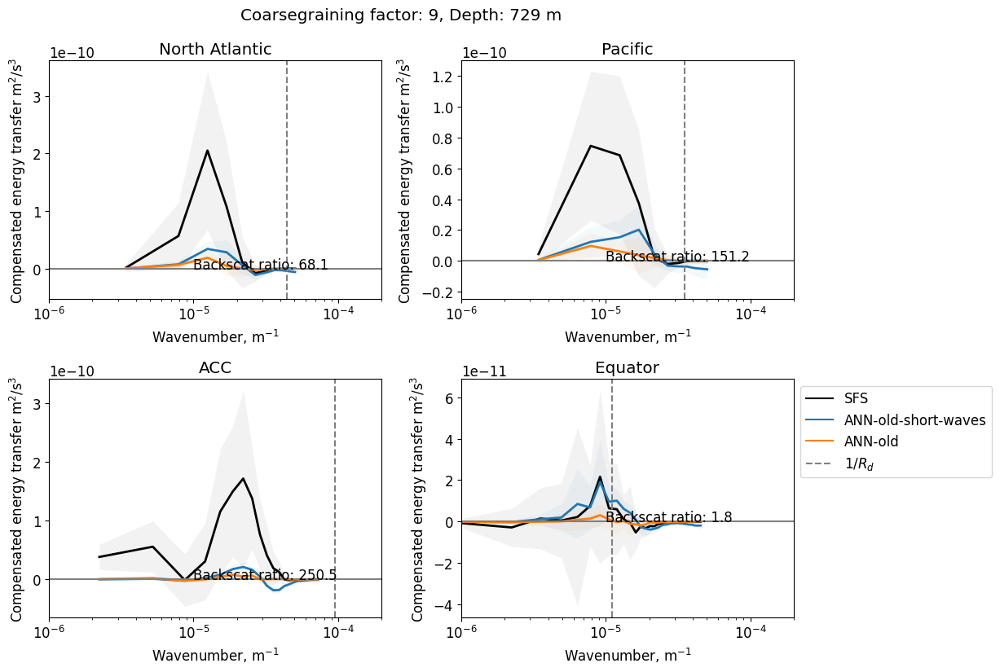

In [20]:
plot_transfer_4_regions([exp_nov17, exp_nov15],labels=['ANN-old-short-waves', 'ANN-old'],factor=9)

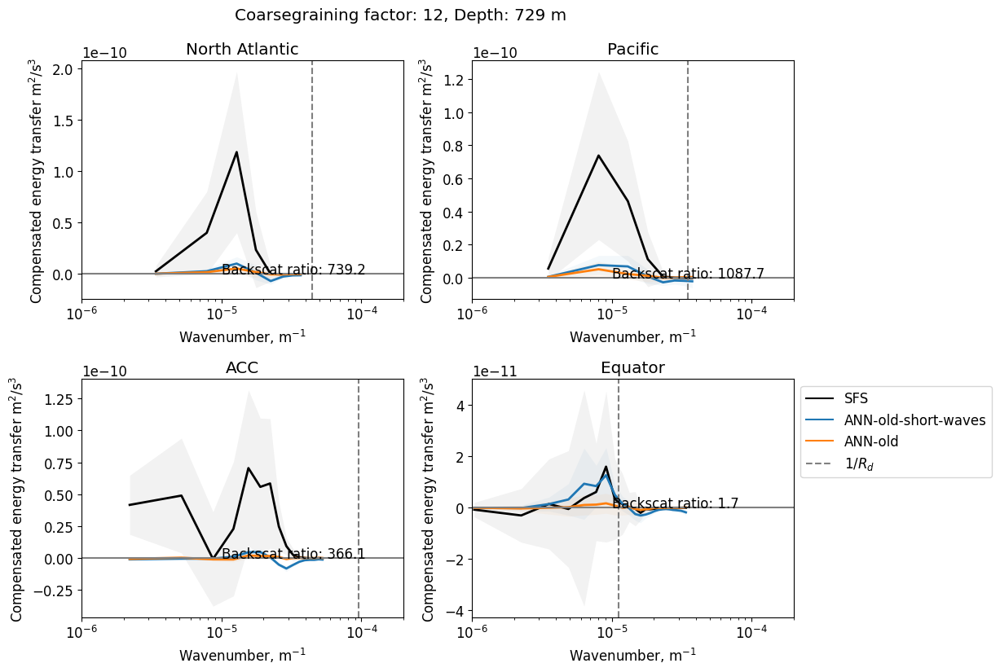

In [21]:
plot_transfer_4_regions([exp_nov17, exp_nov15],labels=['ANN-old-short-waves', 'ANN-old'],factor=12)

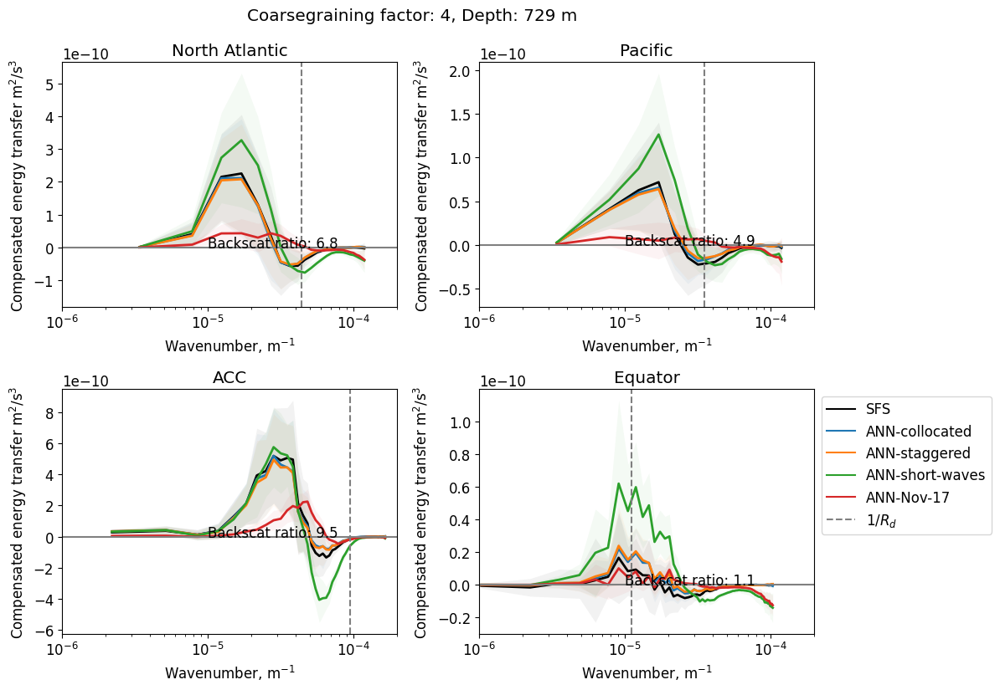

In [15]:
plot_transfer_4_regions([exp_colloc, exp_stag, exp_short, exp_nov17],labels=['ANN-collocated', 'ANN-staggered', 'ANN-short-waves', 'ANN-Nov-17'])

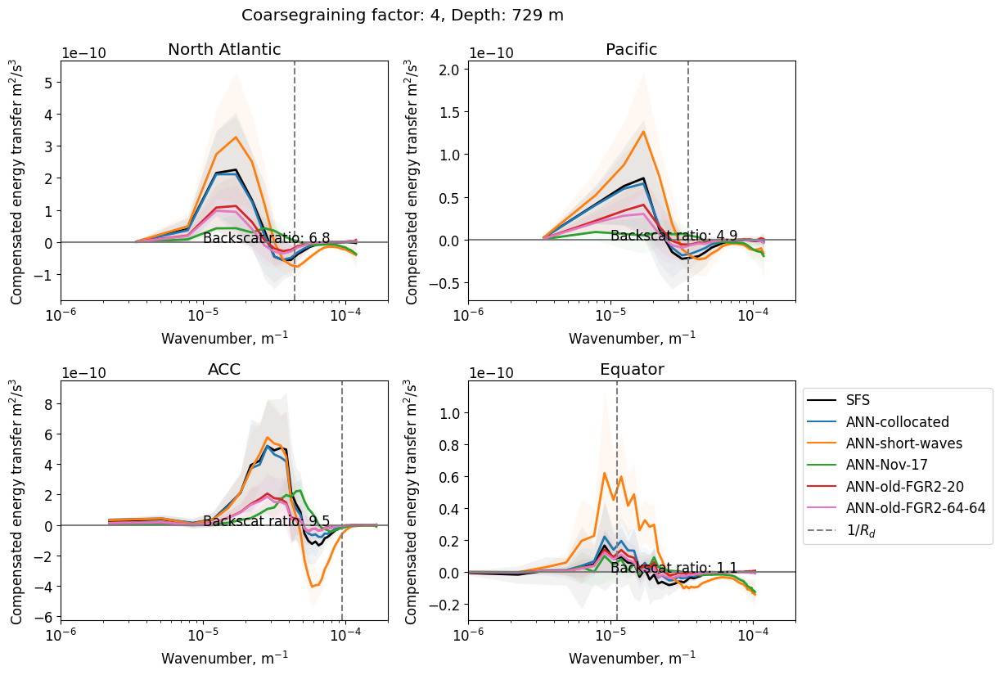

In [60]:
plot_transfer_4_regions([exp_colloc, exp_short, exp_nov17, exp_fgr2_20, exp_fgr2_64_64],
                 labels=['ANN-collocated', 'ANN-short-waves', 'ANN-Nov-17', 'ANN-old-FGR2-20', 'ANN-old-FGR2-64-64'])

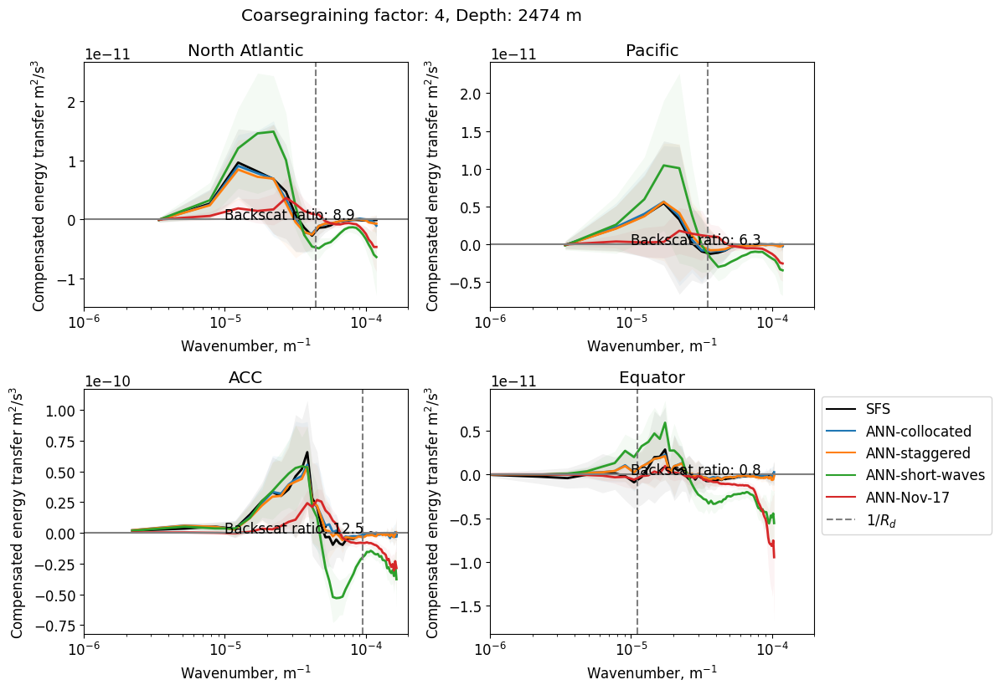

In [16]:
plot_transfer_4_regions([exp_colloc, exp_stag, exp_short, exp_nov17],labels=['ANN-collocated', 'ANN-staggered', 'ANN-short-waves', 'ANN-Nov-17'],zl=7)

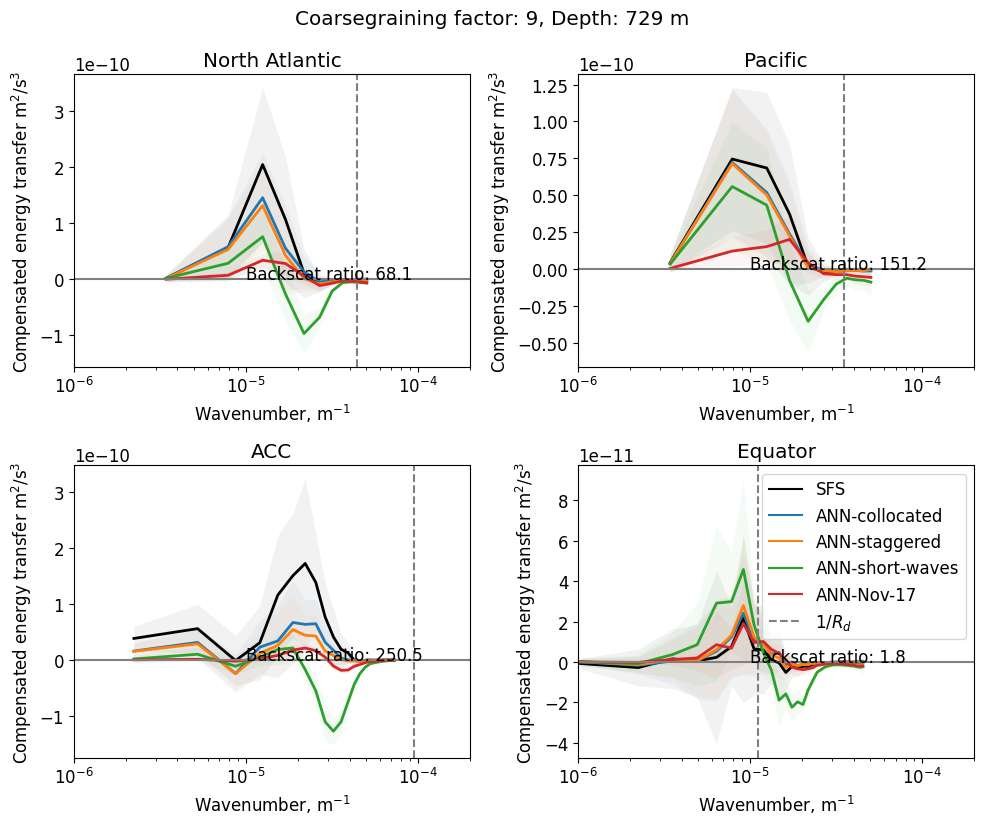

In [17]:
plot_transfer_4_regions([exp_colloc, exp_stag, exp_short, exp_nov17],labels=['ANN-collocated', 'ANN-staggered', 'ANN-short-waves', 'ANN-Nov-17'], factor=9)

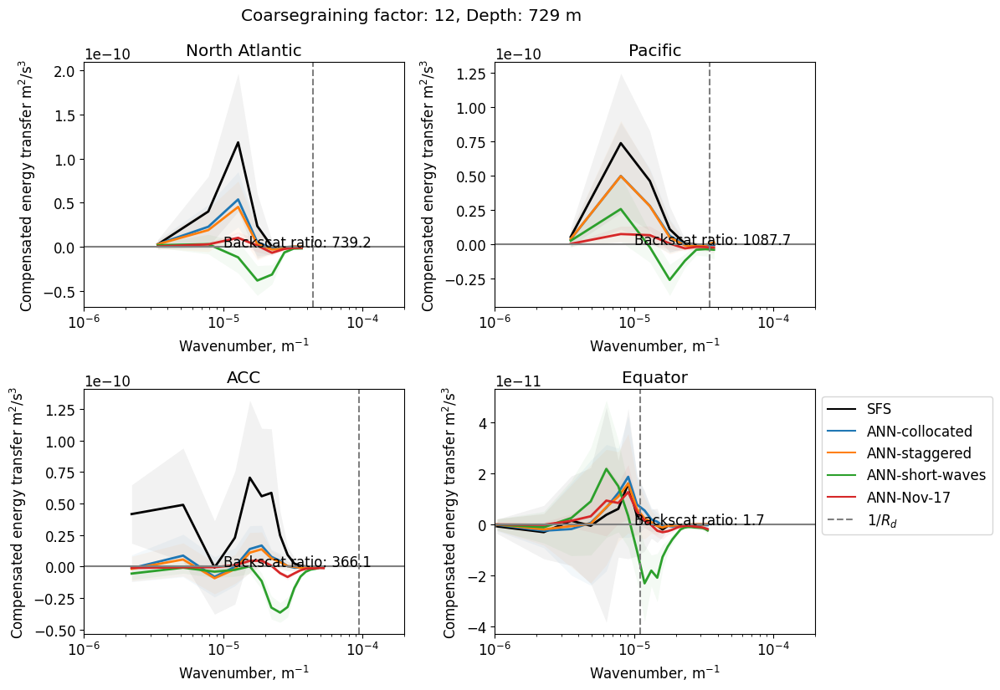

In [18]:
plot_transfer_4_regions([exp_colloc, exp_stag, exp_short, exp_nov17],labels=['ANN-collocated', 'ANN-staggered', 'ANN-short-waves', 'ANN-Nov-17'],factor=12)

# Evaluate old neural networks on new dataset

In [2]:
from helpers.cm26 import read_datasets

In [3]:
ann_Txy_Nov17 = import_ANN('/home/pp2681/MOM6-examples/src/MOM6/experiments/ANN-Results/trained_models/ANN_CM26_grid_harmonic_ver3/Txy_epoch_1000.nc')
ann_Txx_Tyy_Nov17 = import_ANN('/home/pp2681/MOM6-examples/src/MOM6/experiments/ANN-Results/trained_models/ANN_CM26_grid_harmonic_ver3/Txx_Tyy_epoch_1000.nc')

In [4]:
ann_Txy_Nov15 = import_ANN('/home/pp2681/MOM6-examples/src/MOM6/experiments/ANN-Results/trained_models/ANN_CM26/Txy_epoch_2000.nc')
ann_Txx_Tyy_Nov15 = import_ANN('/home/pp2681/MOM6-examples/src/MOM6/experiments/ANN-Results/trained_models/ANN_CM26/Txx_Tyy_epoch_2000.nc')

In [5]:
ann_Txy_FGR2_64_64 = import_ANN('/scratch/pp2681/mom6/CM26_ML_models/surface/Gauss-FGR2/hdn-64-64/model/Txy_epoch_2000.nc')
ann_Txx_Tyy_FGR2_64_64 = import_ANN('/scratch/pp2681/mom6/CM26_ML_models/surface/Gauss-FGR2/hdn-64-64/model/Txx_Tyy_epoch_2000.nc')

In [6]:
ann_Txy_FGR2_20 = import_ANN('/scratch/pp2681/mom6/CM26_ML_models/surface/Gauss-FGR2/hdn-20/model/Txy_epoch_2000.nc')
ann_Txx_Tyy_FGR2_20 = import_ANN('/scratch/pp2681/mom6/CM26_ML_models/surface/Gauss-FGR2/hdn-20/model/Txx_Tyy_epoch_2000.nc')

In [7]:
ds = read_datasets(['test'], [4,9,12,15],'subgrid',-1)

Reading from folder /scratch/pp2681/mom6/CM26_datasets/ocean3d/subgrid/FGR-1/factor-4
Reading from folder /scratch/pp2681/mom6/CM26_datasets/ocean3d/subgrid/FGR-1/factor-9
Reading from folder /scratch/pp2681/mom6/CM26_datasets/ocean3d/subgrid/FGR-1/factor-12
Reading from folder /scratch/pp2681/mom6/CM26_datasets/ocean3d/subgrid/FGR-1/factor-15


In [ ]:
for factor in [4,9,12,15]:
    %time ds[f'test-{factor}'].predict_ANN(ann_Txy_Nov17,ann_Txx_Tyy_Nov17,None).SGS_skill().to_netcdf(f'offline-skill-old-models/Nov17-FGR-1/factor-{factor}.nc')

CPU times: user 5min 51s, sys: 1min 59s, total: 7min 51s
Wall time: 9min 4s
CPU times: user 2min 33s, sys: 5.66 s, total: 2min 38s
Wall time: 2min 50s
CPU times: user 2min 12s, sys: 4.9 s, total: 2min 17s
Wall time: 2min 25s


In [8]:
for factor in [4,9,12,15]:
        %time ds[f'test-{factor}'].predict_ANN(ann_Txy_Nov15,ann_Txx_Tyy_Nov15,None).SGS_skill().to_netcdf(f'offline-skill-old-models/Nov15-FGR-1/factor-{factor}.nc')

CPU times: user 10min 37s, sys: 8min 39s, total: 19min 17s
Wall time: 4min 47s
CPU times: user 4min 43s, sys: 2min 44s, total: 7min 27s
Wall time: 2min 17s
CPU times: user 3min 50s, sys: 37.7 s, total: 4min 28s
Wall time: 1min 59s
CPU times: user 3min 37s, sys: 38.3 s, total: 4min 15s
Wall time: 1min 54s


In [34]:
for factor in [4,9,12,15]:
    %time ds[f'test-{factor}'].predict_ANN(ann_Txy_FGR2_20,ann_Txx_Tyy_FGR2_20,None).SGS_skill().to_netcdf(f'offline-skill-old-models/FGR2_20/factor-{factor}.nc')

CPU times: user 7min 12s, sys: 3min 3s, total: 10min 15s
Wall time: 4min 46s
CPU times: user 3min 10s, sys: 53.7 s, total: 4min 4s
Wall time: 2min 15s
CPU times: user 2min 42s, sys: 16 s, total: 2min 58s
Wall time: 1min 59s
CPU times: user 2min 32s, sys: 15.2 s, total: 2min 47s
Wall time: 1min 53s


In [36]:
for factor in [4,9,12,15]:
    %time ds[f'test-{factor}'].predict_ANN(ann_Txy_FGR2_64_64,ann_Txx_Tyy_FGR2_64_64,None).SGS_skill().to_netcdf(f'offline-skill-old-models/FGR2_64_64/factor-{factor}.nc')

CPU times: user 8min 27s, sys: 3min 35s, total: 12min 3s
Wall time: 5min 10s
CPU times: user 3min 27s, sys: 57.2 s, total: 4min 24s
Wall time: 2min 19s
CPU times: user 2min 51s, sys: 16.6 s, total: 3min 7s
Wall time: 2min
CPU times: user 2min 35s, sys: 14.7 s, total: 2min 50s
Wall time: 1min 53s


# Implementation of collocated ANN is correct? 

In [161]:
data = xr.open_dataset('/scratch/pp2681/mom6/CM26_Double_Gyre/collocated-vs-staggered/collocated/output/mom__0015_018.nc'
                      ).rename({'u_ZB': 'u', 'v_ZB': 'v'}).isel(zl=0,Time=0,xq=slice(1,None), yq=slice(1,None))

In [186]:
param = xr.open_dataset('/scratch/pp2681/mom6/CM26_Double_Gyre/collocated-vs-staggered/collocated/output/ocean_geometry.nc').rename({'lath': 'yh', 'lonh': 'xh', 'latq': 'yq', 'lonq': 'xq'}).isel(xq=slice(1,None), yq=slice(1,None))
param['wet_u'] = 1-np.isnan(data.u)
param['wet_v'] = 1-np.isnan(data.v)
param['wet_c'] = 1-np.isnan(data.Txy)

In [187]:
ds = DatasetCM26(data,param)

In [221]:
ann_Tall_colloc = import_ANN('/scratch/pp2681/mom6/CM26_ML_models/ocean3d/Gauss-FGR3/Collocated-NN-params/hdn-64-64/model/Tall.nc')

In [246]:
pred = ds.state.ANN(None,None, ann_Tall_colloc, gradient_features=['sh_xy', 'sh_xx', 'rel_vort'])

Text(0.5, 1.0, '')

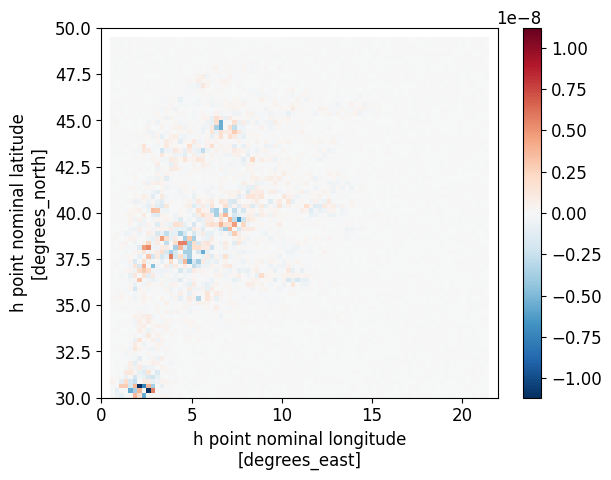

In [243]:
(pred['Txx']-data.Txx).plot()
plt.title('')

Text(0.5, 1.0, '')

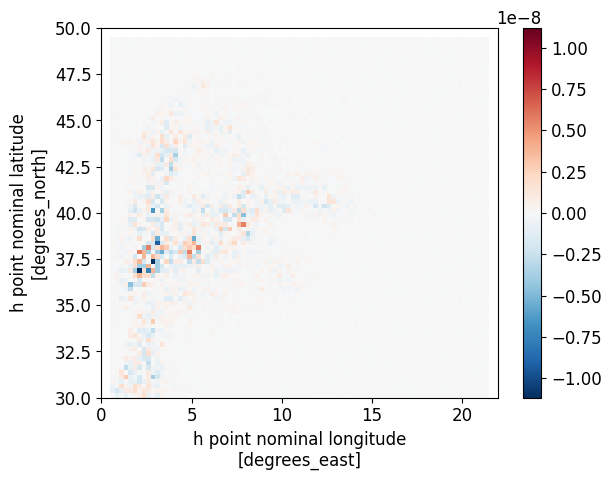

In [244]:
(pred['Tyy']-data.Tyy).plot()
plt.title('')

Text(0.5, 1.0, '')

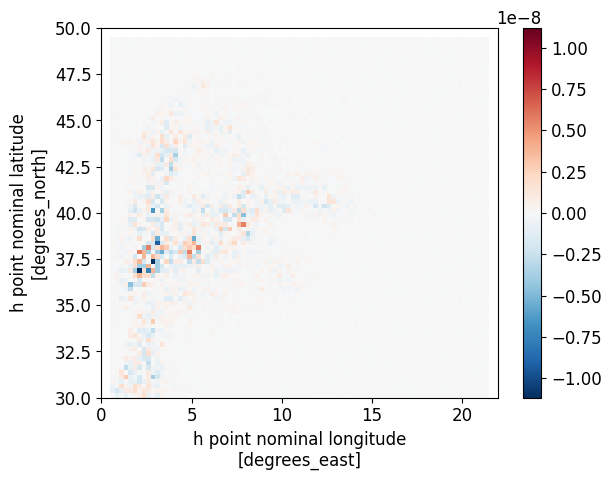

In [245]:
(pred['Tyy']-data.Tyy).plot()
plt.title('')